# **1. Dataset preparation and setup**

In [ ]:
!pip install pytesseract

In [ ]:
# Cell 1: Setup and Imports
import os
import glob
import random
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from google.colab import drive
import json
from collections import defaultdict
from tqdm import tqdm

# Mount Google Drive
drive.mount('/content/drive')

# Set random seed for reproducibility
random.seed(42)
np.random.seed(42)

print("✓ All imports successful and Google Drive mounted!")

Mounted at /content/drive
✓ All imports successful and Google Drive mounted!


In [ ]:
# Cell 2: DatasetManager Class Definition
class DatasetManager:
    def __init__(self, base_path):
        self.base_path = base_path
        self.images_path = os.path.join(base_path, 'images')  # Updated to 'images'
        self.ground_truth_path = os.path.join(base_path, 'ground_truth')
        self.splits_path = os.path.join(base_path, 'splits')

        # Create directories if they don't exist
        os.makedirs(self.images_path, exist_ok=True)
        os.makedirs(self.ground_truth_path, exist_ok=True)
        os.makedirs(self.splits_path, exist_ok=True)

        self.image_data = []
        self.splits = {}

    def load_images_from_drive(self, source_path):
        """
        Load images from Google Drive source path
        Expected naming: Swarupsannidhan_XXXX.jpg/png
        """
        print(f"Loading images from: {source_path}")

        # Find all image files with the pattern
        pattern = os.path.join(source_path, "Swarupsannidhan_*.png")
        image_files = glob.glob(pattern)

        if not image_files:
            print(f"No images found in {source_path}")
            print("Available files:")
            all_files = os.listdir(source_path) if os.path.exists(source_path) else []
            print(all_files[:10])  # Show first 10 files
            return

        print(f"Found {len(image_files)} images")

        # Process each image with progress bar
        for img_path in tqdm(sorted(image_files), desc="Processing images"):
            try:
                # Extract image number from filename
                filename = os.path.basename(img_path)
                # Extract number (assuming format: Swarupsannidhan_XXXX.ext)
                img_num = int(filename.split('_')[1].split('.')[0])

                # Load image to get basic info
                img = Image.open(img_path)
                width, height = img.size

                # Analyze image quality metrics
                img_array = np.array(img.convert('L'))  # Convert to grayscale

                image_info = {
                    'filename': filename,
                    'path': img_path,
                    'number': img_num,
                    'width': width,
                    'height': height,
                    'size_kb': os.path.getsize(img_path) / 1024,
                    'mean_brightness': np.mean(img_array),
                    'std_brightness': np.std(img_array),
                    'aspect_ratio': width / height,
                    'total_pixels': width * height
                }

                self.image_data.append(image_info)

            except Exception as e:
                print(f"Error processing {img_path}: {e}")

        print(f"Successfully loaded {len(self.image_data)} images")
        return self.image_data

print("✓ DatasetManager class defined!")

✓ DatasetManager class defined!


In [ ]:
# Cell 3: Add analysis methods to DatasetManager
def analyze_data_integrity(self):
    """Analyze the integrity and quality of the dataset"""
    if not self.image_data:
        print("No image data available. Load images first.")
        return

    df = pd.DataFrame(self.image_data)

    print("=== DATA INTEGRITY ANALYSIS ===")
    print(f"Total images: {len(df)}")
    print(f"Image number range: {df['number'].min()} to {df['number'].max()}")

    # Check for missing numbers
    expected_numbers = set(range(1, 101))  # Expecting 1-100
    actual_numbers = set(df['number'].tolist())
    missing_numbers = expected_numbers - actual_numbers

    if missing_numbers:
        print(f"Missing image numbers: {sorted(missing_numbers)}")
    else:
        print("✓ All expected image numbers present")

    # Image size analysis
    print(f"\nImage dimensions:")
    print(f"Width range: {df['width'].min()} - {df['width'].max()}")
    print(f"Height range: {df['height'].min()} - {df['height'].max()}")
    print(f"Most common resolution: {df.groupby(['width', 'height']).size().idxmax()}")

    # File size analysis
    print(f"\nFile size analysis:")
    print(f"Size range: {df['size_kb'].min():.1f} - {df['size_kb'].max():.1f} KB")
    print(f"Average size: {df['size_kb'].mean():.1f} KB")

    # Brightness analysis (indicator of scan quality)
    print(f"\nBrightness analysis (quality indicator):")
    print(f"Mean brightness range: {df['mean_brightness'].min():.1f} - {df['mean_brightness'].max():.1f}")
    print(f"Std brightness range: {df['std_brightness'].min():.1f} - {df['std_brightness'].max():.1f}")

    # Identify potentially problematic images
    # Very dark images (might be too dark to read)
    dark_threshold = df['mean_brightness'].quantile(0.2)
    dark_images = df[df['mean_brightness'] < dark_threshold]

    # Very low contrast images
    low_contrast_threshold = df['std_brightness'].quantile(0.2)
    low_contrast_images = df[df['std_brightness'] < low_contrast_threshold]

    print(f"\nPotentially problematic images:")
    print(f"Very dark images (bottom 20%): {len(dark_images)}")
    if len(dark_images) > 0:
        print(f"  Examples: {dark_images['filename'].head(3).tolist()}")

    print(f"Low contrast images (bottom 20%): {len(low_contrast_images)}")
    if len(low_contrast_images) > 0:
        print(f"  Examples: {low_contrast_images['filename'].head(3).tolist()}")

    return df

# Add method to class
DatasetManager.analyze_data_integrity = analyze_data_integrity

print("✓ Data analysis methods added!")

✓ Data analysis methods added!


In [ ]:
# Cell 4: Fixed stratified splitting method
def create_stratified_splits(self):
    """Create stratified train/val/test splits based on image quality metrics"""
    if not self.image_data:
        print("No image data available. Load images first.")
        return

    df = pd.DataFrame(self.image_data)

    print("=== CREATING STRATIFIED SPLITS ===")

    # Create broader strata to avoid single-member groups
    # Use fewer bins to ensure each stratum has enough samples
    try:
        # Try with 3 bins first (terciles)
        df['brightness_tercile'] = pd.qcut(df['mean_brightness'], q=3, labels=['dark', 'medium', 'bright'])
        df['contrast_tercile'] = pd.qcut(df['std_brightness'], q=3, labels=['low', 'medium', 'high'])
        df['quality_strata'] = df['brightness_tercile'].astype(str) + '_' + df['contrast_tercile'].astype(str)

        print(f"Quality strata distribution:")
        strata_counts = df['quality_strata'].value_counts().sort_index()
        print(strata_counts)

        # Check if any strata has only 1 member
        min_strata_size = strata_counts.min()
        if min_strata_size < 2:
            print(f"Warning: Some strata have only {min_strata_size} member(s)")
            print("Falling back to simple random splitting...")
            raise ValueError("Stratification not possible")

        # First split: train (70%) vs temp (30%)
        train_indices, temp_indices = train_test_split(
            df.index,
            test_size=0.3,
            stratify=df['quality_strata'],
            random_state=42
        )

        # Second split: val (15%) vs test (15%) from temp (30%)
        temp_df = df.iloc[temp_indices]
        val_indices, test_indices = train_test_split(
            temp_indices,
            test_size=0.5,  # 50% of 30% = 15%
            stratify=temp_df['quality_strata'],
            random_state=42
        )

        print("✓ Stratified splitting successful!")

    except (ValueError, Exception) as e:
        print(f"Stratified splitting failed: {e}")
        print("Using simple random splitting instead...")

        # Fallback to simple random splitting
        # First split: train (70%) vs temp (30%)
        train_indices, temp_indices = train_test_split(
            df.index,
            test_size=0.3,
            random_state=42
        )

        # Second split: val (15%) vs test (15%) from temp (30%)
        val_indices, test_indices = train_test_split(
            temp_indices,
            test_size=0.5,  # 50% of 30% = 15%
            random_state=42
        )

        print("✓ Random splitting successful!")

    # Create splits dictionary
    self.splits = {
        'train': df.iloc[train_indices][['filename', 'path', 'number']].to_dict('records'),
        'val': df.iloc[val_indices][['filename', 'path', 'number']].to_dict('records'),
        'test': df.iloc[test_indices][['filename', 'path', 'number']].to_dict('records')
    }

    print(f"\nSplit sizes:")
    print(f"Train: {len(self.splits['train'])} images ({len(self.splits['train'])/len(df)*100:.1f}%)")
    print(f"Val: {len(self.splits['val'])} images ({len(self.splits['val'])/len(df)*100:.1f}%)")
    print(f"Test: {len(self.splits['test'])} images ({len(self.splits['test'])/len(df)*100:.1f}%)")

    # Save splits to JSON
    splits_file = os.path.join(self.splits_path, 'data_splits.json')
    with open(splits_file, 'w') as f:
        json.dump(self.splits, f, indent=2)
    print(f"\nSplits saved to: {splits_file}")

    return self.splits

# Add method to class
DatasetManager.create_stratified_splits = create_stratified_splits

print("✓ Splitting method added!")

✓ Splitting method added!


In [ ]:
# Cell 5: Visualization and summary methods
def visualize_sample_images(self, n_samples=6):
    """Visualize sample images from each split"""
    if not self.splits:
        print("No splits available. Create splits first.")
        return

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle('Sample Images from Dataset', fontsize=16)

    splits_list = ['train', 'val', 'test']

    for i, split_name in enumerate(splits_list):
        # Get 2 random samples from each split
        samples = random.sample(self.splits[split_name], min(2, len(self.splits[split_name])))

        for j, sample in enumerate(samples):
            ax = axes[j, i]

            try:
                img = Image.open(sample['path'])
                ax.imshow(img, cmap='gray')
                ax.set_title(f"{split_name.upper()}: {sample['filename']}")
                ax.axis('off')
            except Exception as e:
                ax.text(0.5, 0.5, f"Error loading\n{sample['filename']}",
                       ha='center', va='center', transform=ax.transAxes)
                ax.set_title(f"{split_name.upper()}: Error")

    plt.tight_layout()
    plt.show()

def get_split_summary(self):
    """Get summary of the splits"""
    if not self.splits:
        return "No splits available"

    summary = {}
    for split_name, split_data in self.splits.items():
        numbers = [item['number'] for item in split_data]
        summary[split_name] = {
            'count': len(split_data),
            'number_range': f"{min(numbers)} - {max(numbers)}",
            'sample_files': [item['filename'] for item in split_data[:3]]
        }

    return summary

# Add methods to class
DatasetManager.visualize_sample_images = visualize_sample_images
DatasetManager.get_split_summary = get_split_summary

print("✓ Visualization and summary methods added!")

✓ Visualization and summary methods added!


In [ ]:
# Cell 6: Execute the data processing pipeline
print("=== VLM Assignment - Step 1: Data Preparation ===")

# Initialize dataset manager
base_path = '/content/drive/MyDrive/VLM_Assignment'
dataset_manager = DatasetManager(base_path)

# Path to your images
source_images_path = '/content/drive/MyDrive/VLM_Assignment/images'

print(f"Loading images from: {source_images_path}")

# Load images
image_data = dataset_manager.load_images_from_drive(source_images_path)

=== VLM Assignment - Step 1: Data Preparation ===
Loading images from: /content/drive/MyDrive/VLM_Assignment/images
Loading images from: /content/drive/MyDrive/VLM_Assignment/images
Found 100 images


Processing images: 100%|██████████| 100/100 [00:20<00:00,  4.90it/s]

Successfully loaded 100 images


In [ ]:
# Cell 7: Run data integrity analysis
print("Running data integrity analysis...")
integrity_df = dataset_manager.analyze_data_integrity()

Running data integrity analysis...
=== DATA INTEGRITY ANALYSIS ===
Total images: 100
Image number range: 1 to 100
✓ All expected image numbers present

Image dimensions:
Width range: 1617 - 1755
Height range: 2521 - 2675
Most common resolution: (np.int64(1659), np.int64(2613))

File size analysis:
Size range: 1478.4 - 3999.7 KB
Average size: 3378.3 KB

Brightness analysis (quality indicator):
Mean brightness range: 183.0 - 242.4
Std brightness range: 24.9 - 54.8

Potentially problematic images:
Very dark images (bottom 20%): 20
  Examples: ['Swarupsannidhan_0001.png', 'Swarupsannidhan_0007.png', 'Swarupsannidhan_0056.png']
Low contrast images (bottom 20%): 20
  Examples: ['Swarupsannidhan_0001.png', 'Swarupsannidhan_0002.png', 'Swarupsannidhan_0003.png']


In [ ]:
# Cell 8: Create train/val/test splits
print("Creating train/validation/test splits...")
splits = dataset_manager.create_stratified_splits()

# Print split summary
print("\n=== SPLIT SUMMARY ===")
summary = dataset_manager.get_split_summary()
print(json.dumps(summary, indent=2))

Creating train/validation/test splits...
=== CREATING STRATIFIED SPLITS ===
Quality strata distribution:
quality_strata
bright_high       1
bright_low       25
bright_medium     7
dark_high        15
dark_low          6
dark_medium      13
medium_high      17
medium_low        3
medium_medium    13
Name: count, dtype: int64
Falling back to simple random splitting...
Stratified splitting failed: Stratification not possible
Using simple random splitting instead...
✓ Random splitting successful!

Split sizes:
Train: 70 images (70.0%)
Val: 15 images (15.0%)
Test: 15 images (15.0%)

Splits saved to: /content/drive/MyDrive/VLM_Assignment/splits/data_splits.json

=== SPLIT SUMMARY ===
{
  "train": {
    "count": 70,
    "number_range": "2 - 100",
    "sample_files": [
      "Swarupsannidhan_0012.png",
      "Swarupsannidhan_0048.png",
      "Swarupsannidhan_0086.png"
    ]
  },
  "val": {
    "count": 15,
    "number_range": "13 - 91",
    "sample_files": [
      "Swarupsannidhan_0027.png",
 

Visualizing sample images from each split...


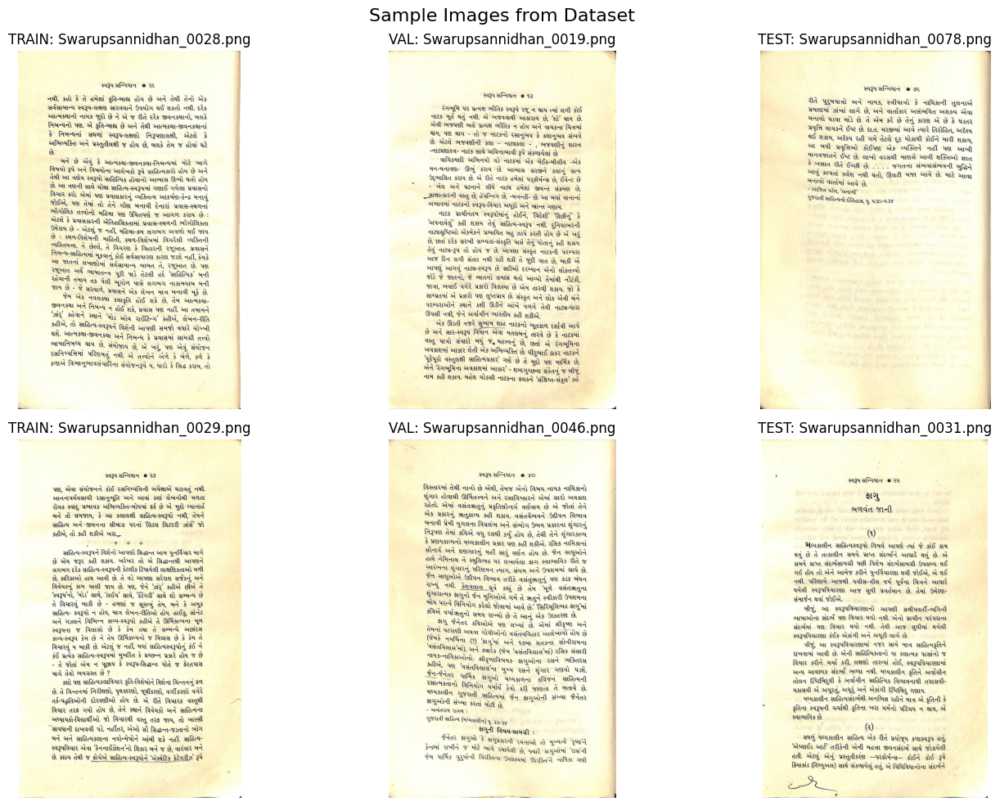

✅ Step 1 completed successfully!

Next steps:
1. Review the data integrity analysis
2. Check the sample images for quality
3. Proceed to Step 2: Advanced Image Processing


In [ ]:
# Cell 9: Visualize sample images from each split
print("Visualizing sample images from each split...")
dataset_manager.visualize_sample_images()

print("✅ Step 1 completed successfully!")
print("\nNext steps:")
print("1. Review the data integrity analysis")
print("2. Check the sample images for quality")
print("3. Proceed to Step 2: Advanced Image Processing")

In [ ]:
# Cell 10: Install Tesseract OCR and PyTesseract
# This cell needs to be run only once in your Colab session.

print("Installing Tesseract OCR and Gujarati language pack...")
# Update apt-get to ensure we get the latest packages
!sudo apt update
# Install Tesseract OCR engine and the Gujarati language data ('guj')
!sudo apt install tesseract-ocr tesseract-ocr-guj
# Install the Python wrapper for Tesseract
!pip install pytesseract

print("✓ Tesseract OCR and PyTesseract installed!")


In [ ]:
# Cell 11: Add OCR Method to DatasetManager
# This cell adds a new method to your existing DatasetManager class.

import pytesseract
from PIL import Image
from tqdm.notebook import tqdm # Import tqdm for progress bars in Jupyter/Colab notebooks

# Configure Tesseract (ensure this path is correct for Colab)
pytesseract.pytesseract.tesseract_cmd = (
    r'/usr/bin/tesseract'
)

def perform_ocr_and_save_initial_ground_truth(self, tesseract_lang='guj'):
    """
    Performs OCR on all images in the dataset splits (train, val, test)
    and saves the initial text extractions to the corresponding ground_truth
    subdirectories.

    This is an initial pass and the generated text will likely require
    manual correction, especially for badly scanned documents.
    """
    if not self.splits:
        print("Error: Dataset splits not found. Please run create_stratified_splits first.")
        return

    print(f"\n=== Performing Initial OCR Pass (Language: {tesseract_lang}) ===")
    print("Saving initial OCR outputs to: ")
    print(f"  - {self.ground_truth_path}/train/")
    print(f"  - {self.ground_truth_path}/val/")
    print(f"  - {self.ground_truth_path}/test/")
    print("\n**WARNING:** These outputs are a starting point. Manual correction is CRITICAL.")

    # Iterate through each split (train, val, test)
    for split_name, image_list in self.splits.items():
        print(f'\nRunning OCR for {split_name} set ({len(image_list)} images)...')
        # Determine the ground truth directory for the current split
        current_gt_dir = os.path.join(self.ground_truth_path, split_name)
        os.makedirs(current_gt_dir, exist_ok=True) # Ensure directory exists

        # Process each image in the current split with a progress bar
        for img_info in tqdm(image_list, desc=f'OCR on {split_name} images'):
            img_path = img_info['path']
            # Construct the filename for the ground truth text file
            gt_filename = os.path.splitext(img_info['filename'])[0] + '.txt'
            gt_filepath = os.path.join(current_gt_dir, gt_filename)

            # Skip OCR if the ground truth file already exists
            # This is useful if you're re-running and don't want to overwrite
            # manually corrected files.
            if os.path.exists(gt_filepath):
                # print(f'  Skipping OCR for {img_info['filename']} - GT file already exists.')
                continue

            try:
                # Load the image using Pillow (PIL)
                img = Image.open(img_path)
                # Perform OCR using pytesseract
                text = pytesseract.image_to_string(img, lang=tesseract_lang)
                # Save the extracted text to the ground_truth directory
                with open(gt_filepath, 'w', encoding='utf-8') as f:
                    f.write(text.strip()) # .strip() removes leading/trailing whitespace

            except Exception as e:
                print(f"Error processing {img_info['filename']} for OCR: {e}")

    print('\n✓ Initial OCR pass completed for all splits.')
    print("Now, proceed to the most important step: **MANUAL CORRECTION** of these generated .txt files.")

# Add the new method to the DatasetManager class
DatasetManager.perform_ocr_and_save_initial_ground_truth = perform_ocr_and_save_initial_ground_truth

print("✓ `perform_ocr_and_save_initial_ground_truth` method added to DatasetManager!")

✓ `perform_ocr_and_save_initial_ground_truth` method added to DatasetManager!


In [ ]:
# Cell 12: Execute OCR and Save Initial Ground Truth
# Run this cell to start the OCR process.

print("Executing the initial OCR pass...")
# Call the new method on your dataset_manager instance
dataset_manager.perform_ocr_and_save_initial_ground_truth(tesseract_lang='guj')

print("\n--- IMPORTANT NEXT STEP ---")
print("1. **Manually review and correct** every single `.txt` file generated in your `ground_truth/train`, `ground_truth/val`, and `ground_truth/test` folders.")
print("   - This is absolutely critical for the success of your VLM.")
print("   - Compare the text file content character-by-character with the original image.")
print("   - Pay attention to line breaks, paragraphs, and any structural elements.")
print("2. Once you are confident that all ground truth files are perfectly accurate, proceed to the next cell to verify their existence.")

Executing the initial OCR pass...

=== Performing Initial OCR Pass (Language: guj) ===
Saving initial OCR outputs to: 
  - /content/drive/MyDrive/VLM_Assignment/ground_truth/train/
  - /content/drive/MyDrive/VLM_Assignment/ground_truth/val/
  - /content/drive/MyDrive/VLM_Assignment/ground_truth/test/

**WARNING:** These outputs are a starting point. Manual correction is CRITICAL.

Running OCR for train set (70 images)...


OCR on train images:   0%|          | 0/70 [00:00<?, ?it/s]


Running OCR for val set (15 images)...


OCR on val images:   0%|          | 0/15 [00:00<?, ?it/s]


Running OCR for test set (15 images)...


OCR on test images:   0%|          | 0/15 [00:00<?, ?it/s]


✓ Initial OCR pass completed for all splits.
Now, proceed to the most important step: **MANUAL CORRECTION** of these generated .txt files.

--- IMPORTANT NEXT STEP ---
1. **Manually review and correct** every single `.txt` file generated in your `ground_truth/train`, `ground_truth/val`, and `ground_truth/test` folders.
   - This is absolutely critical for the success of your VLM.
   - Compare the text file content character-by-character with the original image.
   - Pay attention to line breaks, paragraphs, and any structural elements.
2. Once you are confident that all ground truth files are perfectly accurate, proceed to the next cell to verify their existence.


In [ ]:
# Cell 13: Verify Ground Truth Files Existence
# Run this cell *after* you have completed the manual correction of all ground truth files.

print("Verifying ground truth files existence...")
# Call the verification method
dataset_manager.verify_ground_truth_existence()

print("\nIf all ground truth files are present and you are confident in their accuracy,")
print("you can now proceed to Step 2: Advanced Image Processing.")

Verifying ground truth files existence...

=== Verifying Ground Truth Files Existence ===

Checking train set (70 images):

Checking val set (15 images):

Checking test set (15 images):
✓ All ground truth text files are present for all images across all splits.

If all ground truth files are present and you are confident in their accuracy,
you can now proceed to Step 2: Advanced Image Processing.



=== Visualizing 10 Sample Images from the train Split ===
Their corresponding Ground Truth text will be printed below each image.
Use this to manually compare and correct the ground truth text files.


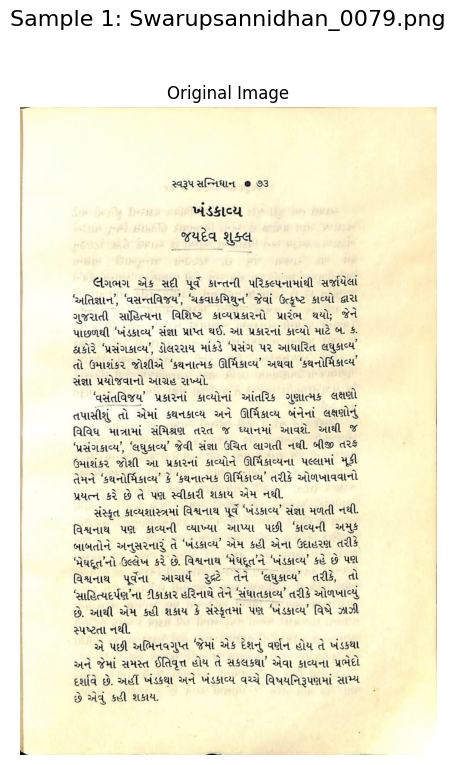


--- Ground Truth for Swarupsannidhan_0079.png ---
સ્વરૂપ સન્નિધાન ૦ ૭૩
ખંડકાવ્ય
જયદેવ શુક્લ

લગભગ એક સદી પૂર્વા કાન્તની પરિક્લ્પનામાંથી સર્જાયેલાં
“આતિજ્ઞાન) “વસન્‍્તવિજય” “ચક્રવાકમિથુન' જેવાં ઉત્કૃષ્ટ કાવ્યો દ્વારા
ગુજરાતી સૉંહેત્યના વિશિષ્ટ કાવ્યપ્રકારનો પ્રારંભ થયો; જેને
પાછળથી “ખંડકાવ્ય સંજ્ઞા પ્રાપ્ત થઈ. આ પ્રકારનાં કાવ્યો માટે બ. ક.
ઠાકોરે “્રસંગકાવ્ય', ડોલરરાય માંકડે “પ્રસંગ પર આધારિત લઘુકાવ્ય'
તો ઉમાશંકર જોશીએ કથનાત્મક ઊર્મિકાવ્ય' અથવા “કથનોર્મિકાવ્ય'
સંજ્ઞા પ્રયોજવાનો આગ્રહ રાખ્યો.

'વસંતવિજય* પ્રકારનાં કાવ્યોનાં આંતરિક ગુણાત્મક લક્ષણો
તપાસીશું તો એમાં કથનકાવ્ય અને ઊર્મિકાવ્ય બંનેનાં લક્ષણોનું
વિવિધ માત્રામાં સંમિશ્રણ તરત જ ધ્યાનમાં આવશે. આથી જ
'્રસંગકાવ્ય| “લઘુકાવ્ય' જેવી સંજ્ઞા ઉચેત લાગતી નથી. બીજી તરફ
ઉમાશંકર જોશી આ પ્રકારનાં કાવ્યોને ઊર્મિકાવ્યના પલ્લામાં મૂકી
તેમને “કથનોર્મિકાવ્ય' કે “કથનાત્મક ઊર્મિકાવ્ય તરીકે ઓળખાવવાનો
પ્રયત્ન કરે છે તે પણ સ્વીકારી શકાય એમ નથી.

સંસ્કૃત કાવ્યશાસ્ત્રમાં વિશ્વનાથ પૂર્વ 'ખંડકાવ્ય' સંજ્ઞા મળતી નથી.
વિશ્વનાથ પણઃ કાવ્યની વ્યાખ્યા આપ્યા પછી કા

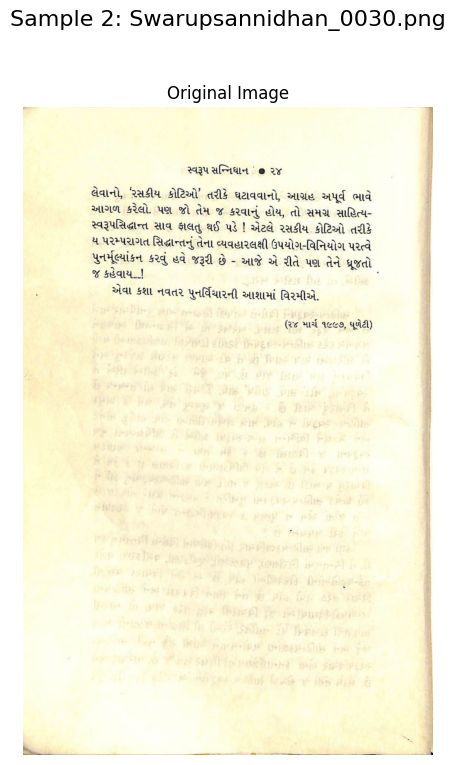


--- Ground Truth for Swarupsannidhan_0030.png ---
સ્વરૂપ સન્નિધાન ' ૪ ર૪

લેવાનો, 'રસકીય કોટિઓ' તરીકે ઘટાવવાનો, આગ્રહ અપૂર્વ ભાવે
આગળ કરેલો. પણ જો તેમ જ કરવાનું હોય, તો સમગ્ર સાહિત્ય-
સ્વરૂપસિદ્ધાન્ત સાવ ફાલતુ થઈ પડે ! એટલે રસકીય કોટિઓ તરીકે
ય પરમ્પરાગત સિદ્ધાન્તનું તેના વ્યવવહારલક્ષી ઉપયોગ-વિિયોગ પરત્વે

પુનર્મૂલ્યાંકન કરવું હવે જરૂરી છે - આજે એ રીતે પણ તેને ધ્રૂજતો

જ કહેવાય...!
એવા કશા નવતર પુનર્વિચારની આશામાં વિરમીએ.

(ર૪ માર્ચ ૧૯૯૭, ધૂળેટી)
--------------------------------------------------



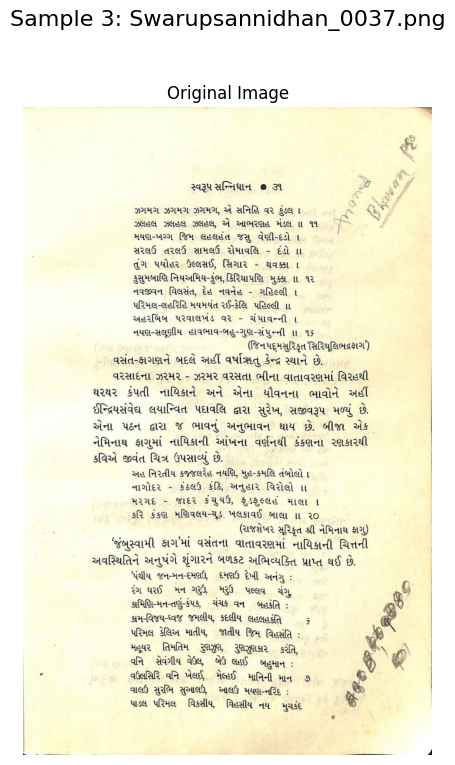


--- Ground Truth for Swarupsannidhan_0037.png ---
સ્વરૂપ સત્નિધાન 9 ૩૧ ટ

ઝગમગ ઝગમગ ઝગમગ, એ સનિહિ વર કુંડલ । 3 ષ્‌ ર
ઝ્લહલ ઝલહલ ઝ્લહલ, એ આભરણહ મંડલ ॥ ૧૧ /
મયણ-ખગ્ગ જિમ લહલહંત જસુ વેણી-દડો ।
સરલઉ તરલઉ સામલઉ રોમાવલિ - દંડો ॥
તુંગ પયોહર ઉલ્લસઈ, સિંગાર - થવક્કા ।
કુસુમબાણિ નિયઅમિય-કુંભ, કિરિથાપણિ મુક્કા ॥ ૧ર
નવજીવન વિલસંત, દેહ નવનેહ - ગહિલ્લી ।
પરિમલ-લહરિહિ મયમયંત રઈ-કેલિ પહિલ્લી ॥
અહરબિબ પરવાલખંડ વર - ચંપાવન્ની ।
નયણ-સલૂણીય હાવભાવ-બહુ-ગુણ-સંપુન્ની ।। ૧૭ ૪
(જિનપદ્મસુરિકૃત 'સિરિથૂલિભદ્રફાગ)
વસંત-ફાગણને બદલે અહીં વર્ષાત્રદતુ કેન્દ્ર સ્થાને છે.
વરસાદના ઝરમર - ઝરમર વરસતા ભીના વાતાવરણમાં વિરહથી
થરથર કંપતી નાયિકાને અને એના યૌવનના ભાવોને અઠીં
ઈન્દ્રિયસંવેધ લયાસ્વત પદાવલિ દ્વારા સુરેખ, સજીવરૂપ મળ્યું છે.
એના પઠન દ્વારા જ ભાવનું અનુભાવન થાય છે. બીજા એક
નેમિનાથ ફાગૃમાં નાયિકાની આંખના વર્ણનથી કંકણના રણકારથી
કવિએ જીવંત ચિત્ર ઉપસાવ્યું છે.
અહ નિરતીય કજ્જલરેહ નયણિ, મુહ-કમલિ તંબોલો ।
નાગોદર - કંઠલઉ કંઠિ, અનૃહાર વિરોલો ॥
મરગદ - જાદર કંચૂ્‌યઉ, ફૂડફલ્લડ માલા ।
કરિ કંકણ મણિવલય-ચૂડ ખલકાવઈ બાલા । ર૦
ા (રાજશેખ

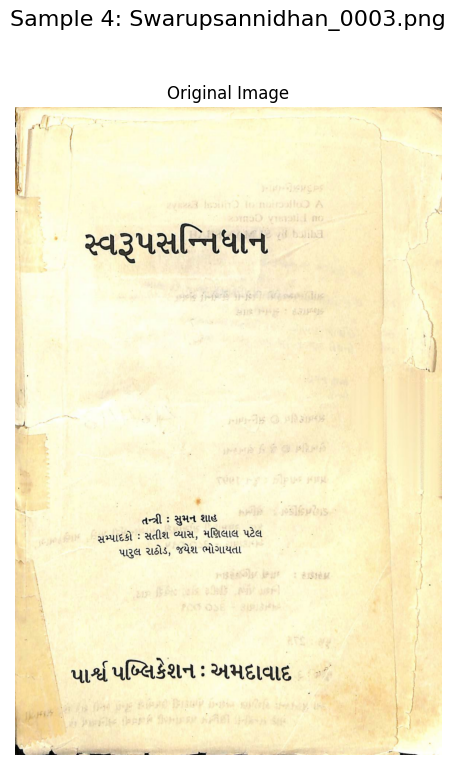


--- Ground Truth for Swarupsannidhan_0003.png ---
સ્વરૂપસન્નિધાન

ફર
તન્ત્રી : સુમન શાહ
સમ્પાદકો : સતીશ વ્યાસ, મણિલાલ પટેલ
પારુલ ચઠોડ, જયેશ ભોગાયતા

જ દ.
હિટ ં કાં

 પાર્શ્વપબ્લિકેશનઃ અમદાવાદ

આઇ ્ન્-
--------------------------------------------------



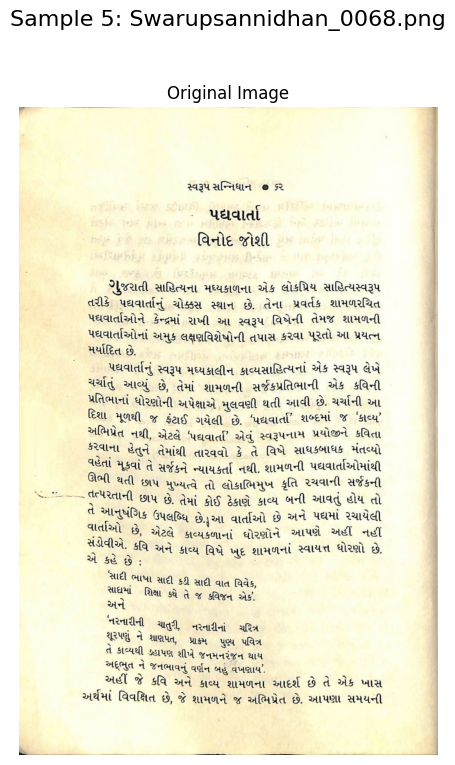


--- Ground Truth for Swarupsannidhan_0068.png ---
ફૂટ.

સ્વરૂપ સન્નિધાન 9 દર

પઘયવાર્તા
વિનોદ જોશી

"જરાતી સાહિત્યના મધ્યકાળના એક લોકપ્રિય સાહિત્યસ્વરૂપ
તરીકે પઘવાર્તાનું ચોક્કસ સ્થાન છે. તેના પ્રવર્તક શામળરચેત
પઘવાર્તાઓને કેન્દ્રમાં રાખી આ સ્વરૂપ વિષેની તેમજ શામળની
પઘવાર્તાઓનાં અમુક લક્ષણવિશેષોની તપાસ કરવા પૂરતો આ પ્રયત્ન
મર્યાદિત છે.

પઘવાર્તાનું સ્વરૂપ મધ્યકાલીન કાવ્યસાહિત્યનાં એક સ્વરૂપ લેખે
ચર્ચાતું આવ્યું છે, તેમાં શામળની સર્જકપ્રતિભાની એક કવિની
પ્રતિભાનાં ધોરણોની અપેક્ષાએ મુલવણી થતી આવી છે. ચર્ચાની આ
દિશા મૂળથી જ ફંટાઈ ગયેલી છે. “પધ્યવાર્તા' શબ્દમાં જ કાવ્ય
અભિપ્રેત નથી, એટલે “પદ્યવાર્તા' એવું, સ્વરૂપનામ પ્રયોજીને કવિતા
કરવાના હેતુને તેમાંથી તારવવો કે તે વિષે સાધકબાધક મંતવ્યો
નપતા મૂકવાં તે સર્જકને ન્યાયકર્તા નથી. શામળની પઘવાર્તાઓમાંથી
ઊભી થતી છાપ મુખ્યત્વે તો લોકાભિમુખ કફૂુતિ રચવાની સર્જકની

- -(પરતાની છાપ છે. તેમાં કોઈ ઠેકાણે કાવ્ય બની આવતું હોય તો

૯ આનુષંગિક ઉપલાબ્વિ છે.આ વાર્તાઓ છે અને પદમાં રચાયેલી
કી છં, એટલે કાવ્યકળાનાં ધોરણોને આપણે અહીં નહીં
ર વીએ. કવિ અને કાવ્ય વિષે ખ

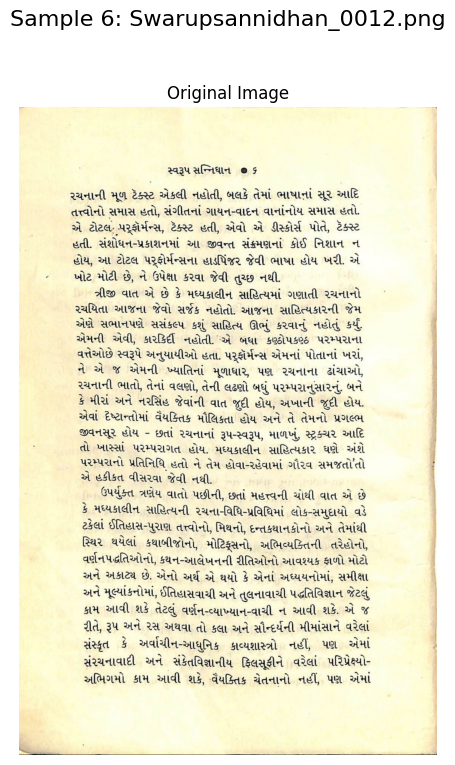


--- Ground Truth for Swarupsannidhan_0012.png ---
સ્વરૂપ સન્નિઘાન ૦ ૬

રચનાની મૂળ (ટૅક્સ્ટ એકલી નહોતી, બલકે તેમાં ભાષાનાં સૂર આદિ
તત્ત્વોનો સમાસ હતો, સંગીતનાં ગાયન-વાદન વાનાંનોય સમાસ હતો.
એ ટોટલ, પર્ફોર્મન્સ, ટૅક્સ્ટ હતી, એવો એ ડીસ્કોર્સ પોતે, ટૅક્સ્ટ
હતી. સંશોધન-પ્રકાશનમાં આ જીવન્ત સંક્રમણના કોઈ નિશાન ન
હોય, આ ટોટલ પર્ફોર્મન્સના હાડપિંજર જેવી ભાષા હોય ખરી. એ
ખોટ મોટી છે, ને ઉપેક્ષા કરવા જેવી તુચ્છ નથી.

ત્રીજી વાત એ છે કે મઘ્યકાલીન સાહિત્યમાં ગણાતી રચનાનો
રચયિતા આજના જેવો સર્જક નહોતો. આજના સાહિત્યકારની જેમ
એણે સભાનપણે સસંકલ્પ કશું સાહિત્ય ઊભું કરવાનું નહોતું કર્યુ.
એમની એવી, કારકિર્દી નહોતી. “એ બધા કણ્ઠોપકણ્ઠ પરમ્પરાના
વત્તેઓછે સ્વરૂપે અનુયાયીઓ હતા. પર્ફોર્મન્સ એમનાં પોતાનાં ખરાં,
ને એ જ એમની ખ્યાતિનાં મૂળાધારુ પણ રચનાના ઢાંચાઓ,
રચનાની ભાતો, તેનાં વલણો, તેની લઢણો બધું પરમ્પરાનુસારનું. બને
કે મીરાં અને નરસૅંહ જેવાંની વાત જૂદી હોય, અખાની જૂદી હોય.
એવાં દેષ્ટાન્તોમાં વૈયક્તિક મૌલિકતા હોય અને તે તેમનો પ્રગલ્ભ
જીવનસૂર હોય - છતાં રચનાનાં રૂપ-સ્વરૂપ, માળખું, સ્ટ્રક્ચર આદિ

તો ખાસ્સાં પરમ્પર

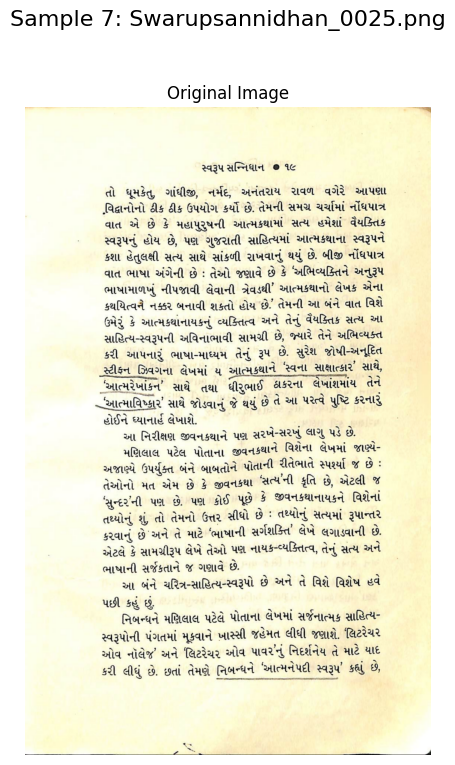


--- Ground Truth for Swarupsannidhan_0025.png ---
સ્વરૂપ સન્નિધાન 9 ૧૯

તો ધૂમકેતુ, ગાંધીજી, નર્મદ, અનંતરાય રાવળ વગેરે આપણા
_વિદ્દાનોનો ઠીક ઠીક ઉપયોગ કર્યો છે. તેમની સમગ્ર ચર્ચામાં નોંધપાત્ર
વાત એ છે કે મહાપુરુષની આત્મકથામાં સત્ય હમેશાં વૈયક્તિક
સ્વરૂપનું હોય છે, પણ ગુજરાતી સાહિત્યમાં આત્મકથાના સ્વરૂપને
કશા હેતુલક્ષી સત્ય સાથે સાંકળી રાખવાનું થયું છે. બીજી નોંધપાત્ર
વાત ભાષા અંગેની છે : તેઓ જણાવે છે કે અભિવ્યક્તિને અનુરૂપ
ભાષામાળખું નીપજાવી લેવાની ત્રેવડથી' આત્મકથાનો લેખક એના
કથયિત્વયૈ નક્કર બનાવી શક્તો હોય છે. તેમની આ બંને વાત વિશે
ઉમેરું કે આત્મકથાનાયકનું વ્યક્તિત્વ અને તેનું વૈયક્તિક સત્ય આ
સાહિત્ય-સ્વરૂપની અવિનાભાવી સામગ્રી છે, જ્યારે તેને અભિવ્યક્ત
કરી આપનારું ભાષા-માધ્યમ તેનું રૂપ છે. સુરેશ જોષી-અનૂદિત
સ્ટીફન ઝિવગના લેખમાં ય આત્મકથાને સવના સાક્ષાત્કાર સાથે,
_આત્મરેખાંકન' સાથે તથા ધીરુભાઈ ઠાકરના લંખાંશમાંય તન
-આત્માવિષ્કાર' સાથે જોડવાનું જે થયું છે તે આ પરત્વે પુષ્ટિ કરનારુ
હોઈને ધ્યાનાર્હ લેખાશે.
આ નિરીક્ષણ જીવનકથાને પણ સરખે-સરખું લાગુ પડે છે.
મણિલાલ પટેલ પોતાના જીવનકથાને વિશેના

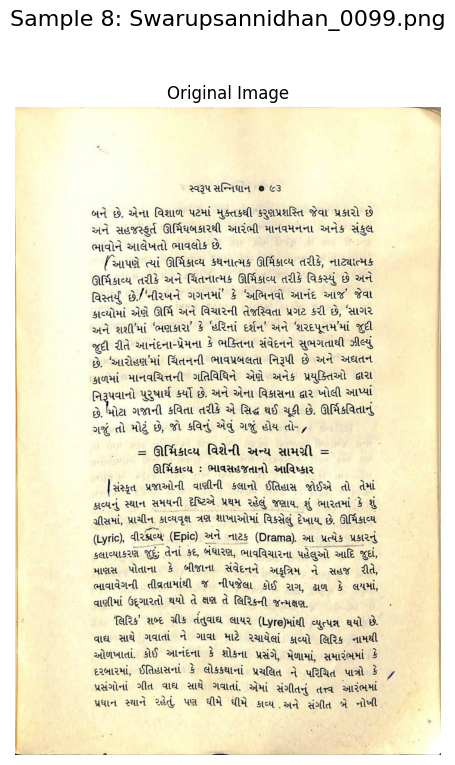


--- Ground Truth for Swarupsannidhan_0099.png ---
સ્વરૂપ સન્તિધાન 9 ૯૩

બને છે. એના વિશાળ પટમાં મુક્તકથી કરૃણપ્રશસ્તિ જેવા પ્રકારો છે
અને કાણી ઊર્મિધબકારથી આરંભી માનવમનના અનેક સંકુલ
ભાવોને આલેખતો ભાવલોક છે.

/ આપણે ત્યાં ઊર્મિકાવ્ય કથનાત્મક ઊર્મિકાવ્ય તરીકે, નાટ્યાત્મક
ઊર્મિકાવ્ય તરીકે અને ચિંતનાત્મક ઊર્મિકાવ્ય તરીકે વિકસ્યું છે અને
વિસ્તર્યું છે/“નીરખને ગગનમાં' કે 'અભિનવો આનંદ આજ” જેવા
કાવ્યોમાં એણે ઊર્મિ અને વિચારની તેજસ્વિતા પ્રગટ કરી છે, “સાગર
અને શશી'માં 'ભણકારા' કે “હરિનાં દર્શન' અને શરદપૂનમ'માં જુદી

જુદી રીતે આનંદના-પ્રેમના કે ભક્તિના સંવેદનને સુભગતાથી ઝીલ્યું
છે. આરોહણ'માં ચિંતનની ભાવપ્રબલતા નિરૂપી છે અને અદ્યતન
કાળમાં માનવચિત્તની ગતિવિધિને એણે અનેક પ્રયુક્તિઓ દ્વારા
લ પુરુષાર્થ કર્યો છે. અને એના વિકાસના દ્વાર ખોલી આપ્યાં

મોટા ગજાની કવિતા તરીકે એ સિદ્ધ થઈ ચૂકી છે . ઊર્મિકવિતાનું
ગજું તો મોટું છે, જો કવિનું એવું ગજું હોય તો- /

- ઊર્મિકાવ્ય વિશેની અન્ય સામગ્રી -
ઊર્મિકાવ્ય : ભાવસહજતાનો આવિષ્કાર

[સંસ્કૃત પ્રજાઓની વાણીની કલાનો ઈતિહાસ જોઈએ તો તેમાં
કાવ્યનું સ્થાન સમયની દૈષ્ટિએ 

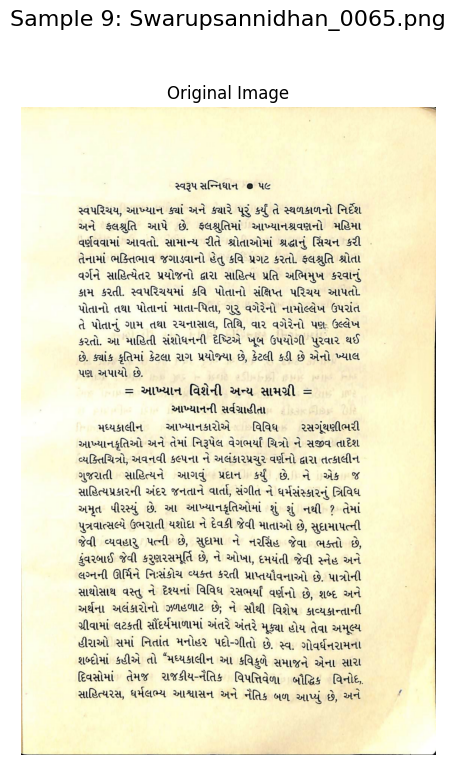


--- Ground Truth for Swarupsannidhan_0065.png ---
સ્વરૂપ સન્નિધાન 9 ૫૯

સ્વપરિચય, આખ્યાન ક્યાં અને ક્યારે પૂરું કર્યું તે સ્થળકાળનો નિદેશ
અને ફલશ્રુતિ આપે છે. ફ્લશ્રુતિમાં આખ્યાનશ્રવણનો મહિમા
વર્ણવવામાં આવતો. સામાન્ય રીતે શ્રોતાઓમાં શ્રદ્ધાનું સિંચન કરી -
તેનામાં ભક્તિભાવ જગાડવાનો હેતુ કવિ પ્રગટ કરતો. ફલશ્રુતિ શ્રોતા
વર્ગને સાહિત્યેતર પ્રયોજનો દ્વારા સાહિત્ય પ્રતિ અભિમુખ કરવાનું
કામ કરતી. સ્વપરિચયમાં કવિ પોતાનો સંક્ષિપ્ત પરિચય આપતો.
પોતાનો તથા પોતાનાં માતા-પિતા, ગુરુ વગેરેનો નામોલ્લેખ ઉપરાંત
તે પોતાનું ગામ તથા રચનાસાલ, તિથિ, વાર વગેરેનો પણ: ઉલ્લેખ
કરતો. આ માહિતી સંશોધનની દષ્ટિએ ખૂબ ઉપયોગી પુરવાર થઈ
છે. ક્યાંક કૃતિમાં કેટલા રાગ પ્રયોજ્યા છે, કેટલી કડી છે એનો ખ્યાલ
પણ અપાયો છે.
- આખ્યાન વિશેની અન્ય સામગ્રી -
આખ્યાનની સર્વગ્રાહીતા

મધ્યકાલીન આખ્યાનકારોએ વિવિધ રસગૂંથણીભરી
આખ્યાનકૃતિઓ અને તેમાં નિરૂપેલ વેગભર્યાં ચિત્રો ને સજીવ તાદેશ
વ્યક્તિચિત્રો, અવનવી કલ્પના ને અલંકારપ્રચુર વર્ણનો દ્વારા તત્કાલીન
ગુજરાતી સાહિત્યને આગવું પ્રદાન કર્યું છે. ને એક જ
સાહિત્યપ્રકારની અંદર જનતાને વાર્તા, સંગીત 

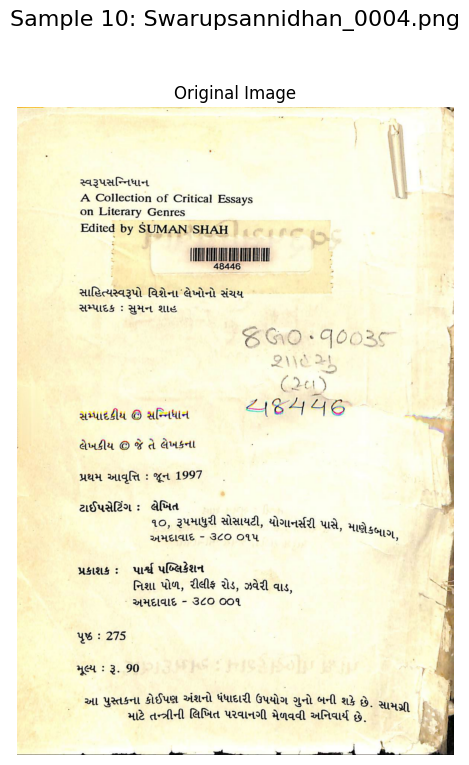


--- Ground Truth for Swarupsannidhan_0004.png ---
સ્વરૂપસન્નિધાન
4 ૯૦11૮૧11૦1 ૦1 ૯1૦1 15૩૦1/5
૦ 11110110 બલા11૯૩

તાવલ્ત ૪) ડ0પ્ત કપ ડાઉ કપ

11110101111
48446

સાહિત્યસ્વરૂપો વિશેના લેખોનો સંચય
સમ્પાદક : સુમન શાહ

૪૯૦ * ૧9૦૩૮

ર
ષી
રન

રન

#
ક જ
ટ
રં

જ
સમ્પાદકીંય છે શસ્મિધાન લ ના

જુ જુ

લેખકીય છે જે તે લેખકના

ર ૪
ધિ

પ્રથમ આવૃત્તિ : જૂન 1997

ઝૈ

ટાઈપસેટિંગ : લેખિત
૧૦, રૂપમાધુરી સોસાયટી, યોગાનર્સરી પાસે, માણેકબા્‌
અમદાવાદ - ૩૮૦ ૦૧૫

પ્રકાશક : પાર્શ્વ પબ્લિકેશન

નિશા પોળ, રીલીફ રોડ, ઝવેરી વાડ,
' અમદાવાદ - ૩૮૦ ૦૦૧

પૃષ્ઠ : 275
મૂલ્ય : રૂ. 90

આ પુસ્તકના કોઈપણ અંશનો ધંધાદારી ઉપયોગ ગુનો બની શકે છે.
માંટે તન્ત્રીની લિખિત પરવાનગી મેળવવી અનિવાર્ય છે.
--------------------------------------------------



In [ ]:
# Cell 14: Visualize Image and Ground Truth Side-by-Side for Manual Review
# This cell helps in the manual correction process by displaying images
# and printing their corresponding OCR-generated (or manually corrected) ground truth text.

import matplotlib.pyplot as plt
from PIL import Image
import os
import random # Ensure random is imported for random.sample
# subprocess and font configuration are no longer needed as text is printed to console
# import subprocess
# import matplotlib.font_manager as fm

# --- START: Font Configuration for Gujarati (Removed for direct console print) ---
# The previous font configuration block is removed as the ground truth text
# will now be printed directly to the console, bypassing Matplotlib's text rendering.
# This avoids font rendering issues within the plot itself.
# If you need Gujarati characters in plot titles or labels, you might need to
# re-introduce a simpler font configuration for Matplotlib.
# --- END: Font Configuration for Gujarati ---


def visualize_image_and_ground_truth(dataset_manager, split_name='train', num_samples=3):
    """
    Visualizes original images and prints their corresponding ground truth text files
    to facilitate manual review and correction.

    Args:
        dataset_manager: An instance of your DatasetManager class.
        split_name (str): The name of the split to visualize ('train', 'val', or 'test').
        num_samples (int): The number of random samples to display from the chosen split.
    """
    if not dataset_manager.splits or split_name not in dataset_manager.splits:
        print(f"Error: Split '{split_name}' not found or splits not created. Please run create_stratified_splits first.")
        return

    print(f"\n=== Visualizing {num_samples} Sample Images from the {split_name} Split ===")
    print("Their corresponding Ground Truth text will be printed below each image.")
    print("Use this to manually compare and correct the ground truth text files.")

    image_list = dataset_manager.splits[split_name]
    if not image_list:
        print(f"No images found in the '{split_name}' split.")
        return

    # Randomly select a few samples to display
    samples_to_display = random.sample(image_list, min(num_samples, len(image_list)))
    current_gt_dir = os.path.join(dataset_manager.ground_truth_path, split_name)

    for i, img_info in enumerate(samples_to_display):
        img_path = img_info['path']
        base_name = os.path.splitext(img_info['filename'])[0]
        gt_filename = f"{base_name}.txt"
        gt_filepath = os.path.join(current_gt_dir, gt_filename)

        fig, ax = plt.subplots(1, 1, figsize=(9, 8)) # Adjusted figsize for single image display
        fig.suptitle(f"Sample {i+1}: {img_info['filename']}", fontsize=16)

        # Display Image
        try:
            img = Image.open(img_path)
            ax.imshow(img)
            ax.set_title("Original Image")
            ax.axis('off')
        except Exception as e:
            ax.text(0.5, 0.5, f"Error loading image:\n{e}", ha='center', va='center', fontsize=12)
            ax.set_title("Image Load Error")
            ax.axis('off')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
        plt.show()

        # Print Ground Truth Text directly to console
        extracted_text = "Ground Truth Not Found or Empty."
        try:
            if os.path.exists(gt_filepath):
                with open(gt_filepath, 'r', encoding='utf-8') as f:
                    content = f.read().strip()
                    if content:
                        extracted_text = content
                    else:
                        extracted_text = "Ground Truth file is empty."
            else:
                extracted_text = f"Ground Truth file missing: {gt_filepath}"
        except Exception as e:
            extracted_text = f"Error reading GT file: {e}"

        print(f"\n--- Ground Truth for {img_info['filename']} ---")
        print(extracted_text)
        print("--------------------------------------------------\n")


# --- How to use this function ---
# You can call this function after running Cell 12 (OCR generation)
# and before running Cell 13 (Ground Truth Verification).

# Example: Visualize 10 random images from the 'train' split
visualize_image_and_ground_truth(dataset_manager, split_name='train', num_samples=10)

# You can change 'train' to 'val' or 'test' to review other splits.
# You can also change num_samples to view more or fewer examples (e.g., 15).

# ***Analysis from manually going through the images***
1. Noise like markings with pens, handwritten notes are interfering with the actual text content
2. The dots prior to page numbers are being read as 9 or 0 (eg img 25)
3. Pages with barcodes are adding a lot of noise (eg image 4)
4. improper scans are being read as noise (eg at the end of image 25, 99 ન .- :--ૂ----૦ )


In [ ]:
# Cell 19: Print Raw Ground Truth for First 10 Images
# This cell will read and print the content of the raw OCR ground truth files
# for the first 10 images in your dataset (across all splits).

import os

def print_raw_ground_truth_for_first_n(dataset_manager, num_images=10):
    """
    Reads and prints the raw OCR ground truth content for the first N images
    in the dataset, sorted by image number.

    Args:
        dataset_manager: An instance of your DatasetManager class.
        num_images (int): The number of images for which to print the raw GT.
    """
    print(f"\n=== Printing Raw Ground Truth for the First {num_images} Images ===")
    print("Please copy these outputs and provide them to me for cleaning.")

    all_image_infos = []
    for split_name in dataset_manager.splits:
        all_image_infos.extend(dataset_manager.splits[split_name])

    # Sort images by their number to get the "first 10" consistently
    all_image_infos.sort(key=lambda x: x['number'])

    # Get the first N images
    images_to_process = all_image_infos[:num_images]

    initial_gt_base_path = dataset_manager.ground_truth_path

    for i, img_info in enumerate(images_to_process):
        filename = img_info['filename']
        base_name = os.path.splitext(filename)[0]

        # Determine the split name for the current image to get correct GT paths
        split_name_for_image = None
        for s_name, s_list in dataset_manager.splits.items():
            if any(item['number'] == img_info['number'] for item in s_list):
                split_name_for_image = s_name
                break

        if not split_name_for_image:
            print(f"\n--- Could not determine split for Image {filename}. Skipping. ---")
            continue

        raw_gt_filepath = os.path.join(initial_gt_base_path, split_name_for_image, f"{base_name}.txt")

        raw_gt_content = "Raw Ground Truth file not found or empty."
        try:
            if os.path.exists(raw_gt_filepath):
                with open(raw_gt_filepath, 'r', encoding='utf-8') as f:
                    content = f.read().strip()
                    if content:
                        raw_gt_content = content
            else:
                raw_gt_content = f"Raw Ground Truth file missing: {raw_gt_filepath}"
        except Exception as e:
            raw_gt_content = f"Error reading Raw GT file: {e}"

        print(f"\n--- Raw Ground Truth for {filename} (Image Number: {img_info['number']}) ---")
        print(raw_gt_content)
        print("------------------------------------------------------------------\n")

# Call the function to print raw ground truth for the first 10 images
print_raw_ground_truth_for_first_n(dataset_manager, num_images=10)



=== Printing Raw Ground Truth for the First 10 Images ===
Please copy these outputs and provide them to me for cleaning.

--- Raw Ground Truth for Swarupsannidhan_0001.png (Image Number: 1) ---
2
ર

જ

ત

ત?

ક
ભ

તત્ત્ી
------------------------------------------------------------------


--- Raw Ground Truth for Swarupsannidhan_0002.png (Image Number: 2) ---
Raw Ground Truth file not found or empty.
------------------------------------------------------------------


--- Raw Ground Truth for Swarupsannidhan_0003.png (Image Number: 3) ---
સ્વરૂપસન્નિધાન

ફર
તન્ત્રી : સુમન શાહ
સમ્પાદકો : સતીશ વ્યાસ, મણિલાલ પટેલ
પારુલ ચઠોડ, જયેશ ભોગાયતા

જ દ.
હિટ ં કાં

 પાર્શ્વપબ્લિકેશનઃ અમદાવાદ

આઇ ્ન્-
------------------------------------------------------------------


--- Raw Ground Truth for Swarupsannidhan_0004.png (Image Number: 4) ---
સ્વરૂપસન્નિધાન
4 ૯૦11૮૧11૦1 ૦1 ૯1૦1 15૩૦1/5
૦ 11110110 બલા11૯૩

તાવલ્ત ૪) ડ0પ્ત કપ ડાઉ કપ

11110101111
48446

સાહિત્યસ્વરૂપો વિશેના લેખોનો સંચય
સમ્પાદક : સુમન શાહ

In [ ]:
# Cell 20: Write Manually Cleaned Ground Truth for First 10 Images
# This cell writes the manually cleaned ground truth content for the first 10 images
# into the 'ground_truth_cleaned' directory.

import os

def write_cleaned_ground_truth_for_first_n(dataset_manager, cleaned_texts_dict):
    """
    Writes the provided cleaned ground truth content to the appropriate files
    in the 'ground_truth_cleaned' directory.

    Args:
        dataset_manager: An instance of your DatasetManager class.
        cleaned_texts_dict (dict): A dictionary where keys are image filenames
                                   (e.g., 'Swarupsannidhan_0001.png') and values
                                   are their cleaned text content.
    """
    print("\n=== Writing Cleaned Ground Truth for the First 10 Images ===")

    cleaned_gt_base_path = os.path.join(dataset_manager.base_path, 'ground_truth_cleaned')

    # Create a mapping from filename to split name for easy lookup
    filename_to_split_map = {}
    for split_name in dataset_manager.splits:
        for img_info in dataset_manager.splits[split_name]:
            filename_to_split_map[img_info['filename']] = split_name

    for filename, cleaned_content in cleaned_texts_dict.items():
        split_name_for_file = filename_to_split_map.get(filename)

        if not split_name_for_file:
            print(f"Warning: Could not determine split for {filename}. Skipping.")
            continue

        base_name = os.path.splitext(filename)[0]
        cleaned_gt_filepath = os.path.join(cleaned_gt_base_path, split_name_for_file, f"{base_name}.txt")

        try:
            # Ensure the target directory exists
            os.makedirs(os.path.dirname(cleaned_gt_filepath), exist_ok=True)
            with open(cleaned_gt_filepath, 'w', encoding='utf-8') as f:
                f.write(cleaned_content.strip()) # .strip() to remove any leading/trailing newlines
            print(f"✓ Cleaned GT saved for {filename} to {cleaned_gt_filepath}")
        except Exception as e:
            print(f"Error writing cleaned GT for {filename}: {e}")

# --- Define the cleaned texts for the first 10 images ---
# You can update these if you find further manual corrections are needed.
cleaned_ground_truths_data = {
    "Swarupsannidhan_0001.png": """સ્વરૂપસન્નિધાન
તન્ત્રી : સુમન શાહ""",
    "Swarupsannidhan_0002.png": "", # This file was empty
    "Swarupsannidhan_0003.png": """સ્વરૂપસન્નિધાન

તન્ત્રી : સુમન શાહ
સમ્પાદકો : સતીશ વ્યાસ, મણિલાલ પટેલ
પારુલ રાઠોડ, જયેશ ભોગાયતા

પાર્શ્વપબ્લિકેશનઃ અમદાવાદ""",
    "Swarupsannidhan_0004.png": """સ્વરૂપસન્નિધાન

સાહિત્યસ્વરૂપો વિશેના લેખોનો સંચય
સમ્પાદક : સુમન શાહ

સમ્પાદકીય © સન્નિધાન

લેખકીય © જે તે લેખકના

પ્રથમ આવૃત્તિ : જૂન 1997

ટાઈપસેટિંગ : લેખિત
૧૦, રૂપમાધુરી સોસાયટી, યોગાનર્સરી પાસે, માણેકબાગ,
અમદાવાદ - ૩૮૦ ૦૧૫

પ્રકાશક : પાર્શ્વ પબ્લિકેશન

નિશા પોળ, રીલીફ રોડ, ઝવેરી વાડ,
અમદાવાદ - ૩૮૦ ૦૦૧

પૃષ્ઠ : 275
મૂલ્ય : રૂ. 90

આ પુસ્તકના કોઈપણ અંશનો ધંધાદારી ઉપયોગ ગુનો બની શકે છે.
માટે તન્ત્રીની લિખિત પરવાનગી મેળવવી અનિવાર્ય છે.""",
    "Swarupsannidhan_0005.png": """નિવેદન

૧૪ સાહિત્યસ્વરૂપોની સિદ્ધાન્ત-ચર્ચાના લેખોનું આ
સમ્પાદન રજૂ કરતાં આનન્દ થાય છે.
આશા છે કે આ પુસ્તકની સામગ્રીનો વિદ્યાર્થીઓ અને
અધ્યાપકો યથોચિત ઉપયોગ કરી શકશે.
સૌ લેખક-મિત્રોનો આ સ્થાનેથી હાર્દિક આભાર. પાર્શ્વના
માલિક બાબુભાઈએ આ પ્રકાશન હાથ ધર્યું તે માટે તેમનો
સવિશેષ આભાર.
૧૬ જૂન, ૧૯૯૭ - સુમન શાહ
તન્ત્રી""",
    "Swarupsannidhan_0006.png": """અનુક્રમણિકા

સાહિત્ય-સ્વરૂપ-સિદ્ધાન્ત
પુનર્વિચાર ભણી... / ૧ / સુમન શાહ
ફાગુ / ૨૫ / બળવંત જાની
આખ્યાન / ૪૩ / બળવંત જાની
આખ્યાન / ૫૩ / પ્રસાદ બ્રહ્મભટ્ટ
પદ્યવાર્તા / ૬૨ / વિનોદ જોશી
ખંડકાવ્ય / ૭૩ / જયદેવ શુક્લ
ઊર્મિકાવ્ય / ૮૫ / ચિમનલાલ ત્રિવેદી
સૉનેટ / ૯૯ / રવીન્દ્ર ઠાકોર
ગઝલ / ૧૨૧ / ચિનુ મોદી
નાટક / ૧૨૭ / સુભાષ શાહ
એકાંકી / ૧૪૧ / રમણ સોની
નવલકથા / ૧૫૯ / રમેશ ઘ. ઓઝા
ટૂંકીવાર્તા / ૧૮૬ / વિજય શાસ્ત્રી
આત્મકથા / ૨૦૧ / સતીશ વ્યાસ
જીવનકથા / ૨૨૬ / મણિલાલ હ. પટેલ
લલિત નિબંધ / ૨૫૮ / મણિલાલ હ. પટેલ""",
    "Swarupsannidhan_0007.png": """સ્વરૂપ સન્નિધાન ૭ ૧
સાહિત્ય-સ્વરૂપ-સિદ્ધાન્ત
પુનર્વિચાર ભણી...
સુમન શાહ

ગુજરાતી સાહિત્યના મધ્યકાલીન અને અર્વાચીન યુગોમાં
પ્રવર્તેલાં ૧૪ સાહિત્ય-સ્વરૂપોને વિશેનો આ ગ્રન્થ અનેકશઃ નોંધપાત્ર
છે. સાહિત્યસ્વરૂપો વિશે કોઈ એક લેખકે ગ્રન્થ કર્યો હોય તેનાથી આ
જુદો છે. આ જુદાં જુદાં સાહિત્યસ્વરૂપોને વિશેના જુદા જુદા લેખકોના
સ્વકીય લેખોનું કાળજીભર્યું સમ્પાદન છે. દરેક અધિકારી વિદ્વાને જે-તે
સાહિત્યસ્વરૂપને અહીં ચીલાચાલુ અભિગમથી છતાં પોતાની આગવી
દૃષ્ટિભંગિ અનુસાર નવેસરથી જોવાનો વિશિષ્ટ પ્રયાસ કર્યો છે.
સાથોસાથ, ગ્રંથમાં પ્રત્યેક લેખને અન્તે તે સ્વરૂપને વિશેનાં અન્ય
વિદ્વાનોનાં પૂર્વકાલીન પુસ્તકો અને/અથવા લેખોમાંથી અમુક નોંધપાત્ર
અંશો ઉદ્ધૃત કરાયા છે અને એમ એક જાતની સમ્પૂર્તિ પણ ઊભી
કરાઈ છે.
અહીં ૩ નોંધપાત્ર મધ્યકાલીન સાહિત્યસ્વરૂપો - ફાગુ, આખ્યાન
અને પદ્યવાર્તા - ની ચર્ચા છે. તો ૧૧ એટલાં જ નોંધપાત્ર અર્વાચીન
સાહિત્યસ્વરૂપો - ખણ્ડકાવ્ય, ઊર્મિકાવ્ય, સોનેટ, ગઝલ, નાટક, એકાંકી,
નવલકથા, ટૂંકીવાર્તા, આત્મકથા, જીવનકથા અને લલિત નિબન્ધ - ની
ચર્ચા છે.
આગવી દૃષ્ટિભંગનો લેખ અને તેની સાથે પૂર્વકાલીન અંશ કે
અંશો - એમ બેવડી ભૂમિકાએ દરેક સાહિત્યસ્વરૂપને વિશેની આપણી
સંચિત સમજમાં બહુશઃ અહીં ઉમેરો થાય છે, તો ક્યારેક એ સમજ
તળે-ઉપર થાય એવું ય બને છે - કેમકે આ સૌ લેખકોમાંના
કેટલાકનાં મન્તવ્યો, એ રીતે વિચારણીય બનેલાં છે. એવાં મન્તવ્યો
સૂચવતા કેટલાક સંકેતોનું એક વિહંગાવલોકન કરીએ :

બળવન્ત જાની સઘળા મધ્યકાલીન સાહિત્યને 'પ્રયોજ્ય કળા’""",
    "Swarupsannidhan_0008.png": """સ્વરૂપ સન્નિધાન ૮ ૨

- એપ્લાઈડ આર્ટ - કહે છે અને તેનો વિધિવિધાનો કે 'ક્રિયાકાણ્ડ'
રીચ્યુઅલ્સ - સાથેનો મૂળ જીવનસંદર્ભ આગળ કરે છે. પરિણામે,
આખ્યાનની પર્ફોર્મન્સ-પરક ભૂમિકા વધારે સાભિપ્રાય અને પ્રતીતિકર
બને છે. એ રીતે એને 'સમૂહ-ભોગ્ય' કલાનો પ્રકાર ગણવામાં ય
તર્કસંગતતા અનુભવાય છે. સાહિત્યસ્વરૂપોની ચર્ચામાં, સ્વરૂપને
ઘડનારી-વિકસાવનારી ચોક્કસ કૃતિઓ કઈ તે દર્શાવવાનું આપણે
જવલ્લે જ કરીએ છીએ. એટલે કે, જે-તે સ્વરૂપની લાક્ષણિકતાઓમાં
નિર્ણાયક નીવડેલી કૃતિઓ લઈને વાત કરવાની પરિપાટી આપણે ત્યાં
ખાસ વિકસી નથી. ફાગુ માટે બળવન્ત જાનીએ ખાસ્સાં દેષ્ટાન્તો રજૂ
કર્યાં છે તે એ પરત્વે સ્પૃહણીય ગણાય.

આખ્યાનના સ્વરૂપનો વિચાર કરતી વખતે તેને મહાકાવ્ય અને
ખણ્ડકાવ્ય સાથે સરખાવી જોવાનો આપણે ત્યાં જાણે કે એક શિરસ્તો
પડી ગયો છે. બળવન્ત જાની અને પ્રસાદ બ્રહ્મભટ્ટ એવી તુલનાઓને
સંભારે છે તે સ્વાભાવિક છે. પણ નોંધપાત્ર વાત એ છે કે બંને
લેખકોએ આખ્યાન-મહાકાવ્ય વચ્ચેનાં સામ્ય-ભેદ તારવીને ઠીકઠીક
પ્રકારે તોડ કાઢ્યો છે અને એમ કરીને, થઈ શકે તેટલું ચોખ્ખું કર્યું
છે. જોઈ શકાશે કે આખ્યાનની રાસ અને પદ્યવાર્તા સાથેની
તુલનાઓને ય એવો જ લાભ મળ્યો છે.

આવી નવતર ચર્ચા-તરેહો ઉપરાન્ત, અહીં, કેટલાંકનાં મન્તવ્યોને
તો સાવ જ જુદાં અને લગભગ મૌલિક કહેવાં પડે એવું પણ છે.
જેમ કે શશિન ઓઝા આખ્યાનમાં આવતાં પદ-ગીતનો અનોખો
મહિમા સૂચવે છે. તેને તેઓ 'હીરા સમાં મનોહર શોભતાં' લેખે છે.
તો વળી લાભશંકર ઠાકર આખ્યાનો ચલચિત્રદર્શકો માટે સરજાયાં
હોય એવી અભિપ્રાયભરી કલ્પના વહેતી કરે છે અને પોતાના
સમર્થનમાં 'સુદામાચરિત'ના 'શૉટ્સ' તારવે-નિર્દેશે છે, વર્ણવે છે. જોકે
તેવાં તેમનાં તારણો કોઈને વધારે પડતાં લાગવાનો સંભવ છે -
એટલા માટે કે એવું તો સારા કોઈપણ કથામૂલક નિરૂપણમાં સહજ
પ્રકારે જ બનવાનું ને વળી તેથી સ્વાભાવિક ગણાવાનું. જોકે એમના
એ પ્રયાસથી આપણી ચીલાચાલુ ચર્ચાને એવે નવે રસ્તે ફંટાવાનું
બન્યું તે આવકાર્ય ગણાવું જોઈએ.""",
    "Swarupsannidhan_0009.png": """સ્વરૂપ સન્નિધાન ૯ ૩

શામળની વાર્તાકલાની અપેક્ષાએ આપણે ત્યાં કાવ્યકલાનાં
ધોરણોએ ચાલ્યા કરેલી તપાસ કે મૂલવણી વિનોદ જોશીને ઠીક નથી
લાગતી. એમને શામળની 'સૌથી મોટી' સર્જક-તાકાત 'ભાવકની નાડ
પરખવામાં' જણાઈ છે. શામળમાં જડી આવતા 'કાવ્ય'ને તેઓ
'આનુષંગિક ઉપલબ્ધિ' ગણે છે. 'પદ્યવાર્તા' શબ્દમાં જ કાવ્ય અભિપ્રેત
નથી ને તેથી તેમાં 'કવિતા કરવાનો હેતુ' સિદ્ધ થયો કે કેમ પૂછીને
સમીક્ષા ચલાવવી તે તેમની દૃષ્ટિએ 'સર્જકને ન્યાયકર્તા નથી'.
રામનારાયણ પાઠકે પદ્યવાર્તાને 'બૃહત્કથા સરિત્ સાગર'થી ચાલી
આવેલી કથાકાવ્ય-પરમ્પરા સાથે સાંકળી છે અને તેવી કથાઓ
'પદ્ય'-બદ્ધ થઈ તેમાં વિકાસની સ્વાભાવિકતાથી વિશેષ કશું જોયું નથી
એ માધ્યમ-પરક મુદ્દો ય અહીં સ્મરણીય છે.

મારો પણ એવો જ મત બંધાયો છે કે 'પદ્ય' મોટા ભાગના
મધ્યકાલીન સાહિત્યનું એક સર્વસાધારણ માધ્યમ હતું તેમ વાર્તાનું ય
હતું. અલબત્ત વાર્તા મધ્યકાળમાં ગદ્યમાં નહોતી એમ નથી તે જુદી
વાત છે. પદ્યનું માધ્યમ હોય કે ન હોય, કથાસૃષ્ટિમાં કાવ્ય પ્રભવી
શકે છે, કાવ્ય સ્વાયત્ત ચીજ છે અને તેથી કથા કે નાટક જેવી ઈતર
સૃષ્ટિઓમાં ય સંભવે છે - શું પદ્ય કે શું ગદ્ય, તેનાં માત્ર માધ્યમ
છે અને તેથી તે તેને રોકી કે આંતરી શકતાં નથી. સવાલ એ રહે
છે કે એવા કાવ્યે કથા કે નાટકની ઈતર સૃષ્ટિઓમાં ઉપકારક ફાળો
શો આપ્યો. એટલે 'પદ્યવાર્તા' શબ્દને કોઈ 'કાવ્ય' શબ્દના અર્થથી
ઓછો, વિરુદ્ધનો કે મુક્ત લેખવા જતાં દોષ કરી બેસે એવો
ભયસંભવ છે. તપાસ તો એમ આદરવી ઘટે કે શામળની પદ્યવાર્તામાં
પદ્ય ક્યારે કાવ્યોપકારક બને છે અને 'એવું કાવ્ય કયારે વાર્તા-
ઉપકારક બને છે તે ચોક્કસ જગ્યા દર્શાવીને કહેવું. શામળની એવી
પદ્યકાર, કાવ્યકાર અને વાર્તાકાર તરીકેની છબિ મેળવવી તે સમગ્ર
સિદ્ધિના સંદર્ભમાં ઉચિત લેખાય. વિનોદ જોશીનો મુદ્દો એમ છે કે
શામળ લોકોભિમુખ સર્જકતાને વરેલો વાર્તાકાર વધારે છે ને તેની
શક્તિની સમીક્ષા એ પરિપાટીએ ન થાય, તો કશો લાભ ન થાય.
વિનોદ જોશીને જેમ શામળની તપાસ કાવ્યકલાનાં ધોરણોએ
અનુચિત જણાઈ છે, તેમ સમગ્ર મધ્યકાલીન પ્રવર્તમાન અભ્યાસ-
પરિપાટી વિશે ય ઔચિત્યના પ્રશ્નો છેડી શકાય. બલકે છેડવાનો""",
    "Swarupsannidhan_0010.png": """સ્વરૂપ સન્નિધાન ૯ ૪

સમય પાકી ગયો છે. એવા અભ્યાસો મોટે ભાગે પાઠ-સંશોધન,
અર્થઘટન કે જ્ઞાન-ભક્તિ-વૈરાગ્યનાં દર્શનોની અભિવ્યક્તિઓ વગેરે
ગણતર મુદ્દાઓમાં સીમિત છે. બહુ બહુ તો એમાં જે-તે મુદ્દાના
પૂર્વાપર ઈતિહાસો અપાય છે, મત-મતાન્તરોની નોંધો લેવાય છે.
મધ્યકાલીન સાહિત્ય પરમ્પરાશીલ હોઈને, જે-તે કવિ કે વાર્તાકારની
વૈયક્તિક શક્તિમત્તાનું માપ પરમ્પરા-ઝીલણ અને પરમ્પરા-પોષણ અર્થે
તેણે શું કર્યું, કેવી રીતે કર્યું તે સંદર્ભે પણ કયારેક એ અભ્યાસોમાં
નોંધપાત્ર સંકેતો અપાય છે. એવા સંકેતો રચવા માટે મોટેભાગે
આપણે સંસ્કૃત કાવ્યશાસ્ત્રની રસ, અલંકાર જેવી વિચારણાઓની
ભૂમિકા સવિશેષ રાખીએ છીએ. એવી જ કશી ભૂમિકાએ આપણે
આખ્યાનકાર પ્રેમાનંદને રસસિદ્ધ કવિ કહ્યો છે. પણ નરસિંહ અને
મીરાંની સૃષ્ટિની વાત કરતી વખતે આપણી એ ભૂમિકા એ-ની-એ
નથી રહેતી. એટલું જ નહીં, ફાગુ રાસા પ્રબન્ધ જેવાં સ્વરૂપો વખતે
એ ભૂમિકા ખાસ્સી બદલાય છે, તો જૈન કવિઓની સૃષ્ટિ વખતે
ઘણીવાર એ ભૂમિકા વિપરીત પણ દીસે છે. સવાલ એ છે કે શું
મધ્યકાલીન સાહિત્યનાં અધ્યયન અને સમીક્ષા-મૂલ્યાંકન માટે સંસ્કૃત
કાવ્યશાસ્ત્રનાં ધોરણો-માનદણ્ડો જ ઉપકારક છે, કે તેમાં કશુંક જુદું
અને વધારે કંઈક ખૂટે છે ?

ઉપકારકતા કરતાં આ પ્રશ્ન પ્રસ્તુતતાને વધારે સ્પર્શે છે. જેમ,
આધુનિક-અર્વાચીન સાહિત્યનું વિવેચન સંસ્કૃત કાવ્યશાસ્ત્રની રીતેભાતે
કરવું હોય તો કરી તો શકાય, પણ એમ કરવું કેટલે અંશે પ્રસ્તુત છે
એમ જે વિમાસણ ઊભી થાય છે, તેમ તે મધ્યકાલીન સાહિત્યનું
વિવેચન માત્ર સંસ્કૃત કાવ્યશાસ્ત્રની રીતેભાતે કરીએ, ત્યારે પણ થાય
જ છે. 'નળાખ્યાન'ની રસસિદ્ધિ, એ જ આખ્યાનકારકૃત
'સુદામાચરિત'ની નથી - સ્વરૂપ-માત્રાએ જુદી છે. મીરાં અને
નરસિંહનાં પદોની કાવ્યસિદ્ધિને ઓળખવા-ઓળખાવવાને 'રસનું શાસ્ત્ર'
ધારો કે પહોંચી પણ વળે, તો ય, તેટલું જ અપનાવવું તે પ્રસ્તુત
નથી. સમથિન્ગ ડીફરન્ટ એન્ડ સમથિન્ગ મૉર હમેશાં જરૂરી વરતાયા
કરે છે. એ જુદું અને એ વધારે કયું તેનો આપણે ત્યાં ઝાઝો વિચાર
નથી થયો. ઘણાઓએ મધ્યકાલીન સાહિત્યને ય સાહિત્ય-કલા ગણીને,
સામ્પ્રતમાં ઉપલબ્ધ કાવ્યત્વ સર્જકતા મૌલિકતા શૈલીવિશેષ વગેરે"""
}

# Call the function to write the cleaned ground truth
write_cleaned_ground_truth_for_first_n(dataset_manager, cleaned_ground_truths_data)


=== Writing Cleaned Ground Truth for the First 10 Images ===
✓ Cleaned GT saved for Swarupsannidhan_0001.png to /content/drive/MyDrive/VLM_Assignment/ground_truth_cleaned/test/Swarupsannidhan_0001.txt
✓ Cleaned GT saved for Swarupsannidhan_0002.png to /content/drive/MyDrive/VLM_Assignment/ground_truth_cleaned/train/Swarupsannidhan_0002.txt
✓ Cleaned GT saved for Swarupsannidhan_0003.png to /content/drive/MyDrive/VLM_Assignment/ground_truth_cleaned/train/Swarupsannidhan_0003.txt
✓ Cleaned GT saved for Swarupsannidhan_0004.png to /content/drive/MyDrive/VLM_Assignment/ground_truth_cleaned/train/Swarupsannidhan_0004.txt
✓ Cleaned GT saved for Swarupsannidhan_0005.png to /content/drive/MyDrive/VLM_Assignment/ground_truth_cleaned/test/Swarupsannidhan_0005.txt
✓ Cleaned GT saved for Swarupsannidhan_0006.png to /content/drive/MyDrive/VLM_Assignment/ground_truth_cleaned/train/Swarupsannidhan_0006.txt
✓ Cleaned GT saved for Swarupsannidhan_0007.png to /content/drive/MyDrive/VLM_Assignment/groun

In [ ]:
# Cell 18: Compare Original Image, Raw GT, and Cleaned GT (Updated)
# This cell helps in verifying the automated pre-cleaning by displaying
# the original image alongside its raw OCR output and the pre-cleaned ground truth,
# reading the ground truth content directly from the files.

import matplotlib.pyplot as plt
from PIL import Image
import os
import re # Already imported in previous cells, but good to ensure

def compare_ground_truths(dataset_manager, image_numbers_to_compare):
    """
    Displays the original image, its raw OCR ground truth, and its cleaned ground truth
    for a specified list of image numbers, reading content directly from files.

    Args:
        dataset_manager: An instance of your DatasetManager class.
        image_numbers_to_compare (list): A list of integer image numbers (e.g., [4, 25, 99, 1, 17, 82]).
    """
    print("\n=== Comparing Original Image, Raw Ground Truth, and Cleaned Ground Truth ===")
    print("Review these comparisons to assess the effectiveness of the automated pre-cleaning.")

    # Create a mapping from image number to its info for easy lookup
    image_info_map = {}
    for split_name in dataset_manager.splits:
        for img_info in dataset_manager.splits[split_name]:
            image_info_map[img_info['number']] = img_info

    # Define paths for ground truth folders
    initial_gt_base_path = dataset_manager.ground_truth_path
    cleaned_gt_base_path = os.path.join(dataset_manager.base_path, 'ground_truth_cleaned')

    for img_num in image_numbers_to_compare:
        img_info = image_info_map.get(img_num)

        if not img_info:
            print(f"\n--- Image Number {img_num} Not Found in Dataset Splits. Skipping. ---")
            continue

        filename = img_info['filename']
        base_name = os.path.splitext(filename)[0]

        # Determine the split name for the current image to get correct GT paths
        # This assumes the image's path contains the split name in its directory structure
        split_name_for_image = None
        for s_name, s_list in dataset_manager.splits.items():
            if any(item['number'] == img_num for item in s_list):
                split_name_for_image = s_name
                break

        if not split_name_for_image:
            print(f"\n--- Could not determine split for Image Number {img_num}. Skipping. ---")
            continue

        # Correctly define img_path here by using img_info['path'] directly
        # as the DatasetManager already stores the full path to the image.
        img_path = img_info['path']

        raw_gt_filepath = os.path.join(initial_gt_base_path, split_name_for_image, f"{base_name}.txt")
        cleaned_gt_filepath = os.path.join(cleaned_gt_base_path, split_name_for_image, f"{base_name}.txt")

        print(f"\n\n--- Comparison for Image: {filename} (Number: {img_num}) ---")

        # Display Original Image
        try:
            img = Image.open(img_path)
            fig, ax = plt.subplots(1, 1, figsize=(10, 8))
            ax.imshow(img)
            ax.set_title(f"Original Image: {filename}")
            ax.axis('off')
            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"Error loading image {filename}: {e}")
            # Ensure the figure is closed even if image loading fails
            if 'fig' in locals() and fig is not None:
                plt.close(fig)

        # Read and Print Raw Ground Truth
        raw_gt_content = "Raw Ground Truth file not found or empty."
        try:
            if os.path.exists(raw_gt_filepath):
                with open(raw_gt_filepath, 'r', encoding='utf-8') as f:
                    content = f.read().strip()
                    if content:
                        raw_gt_content = content
            else:
                raw_gt_content = f"Raw Ground Truth file missing: {raw_gt_filepath}"
        except Exception as e:
            raw_gt_content = f"Error reading Raw GT file: {e}"

        print("\n--- Raw Ground Truth (from initial OCR) ---")
        print(raw_gt_content)
        print("-------------------------------------------\n")

        # Read and Print Cleaned Ground Truth
        cleaned_gt_content = "Cleaned Ground Truth file not found or empty."
        try:
            if os.path.exists(cleaned_gt_filepath):
                with open(cleaned_gt_filepath, 'r', encoding='utf-8') as f:
                    content = f.read().strip()
                    if content:
                        cleaned_gt_content = content
            else:
                cleaned_gt_content = f"Cleaned Ground Truth file missing: {cleaned_gt_filepath}"
        except Exception as e:
            cleaned_gt_content = f"Error reading Cleaned GT file: {e}"

        print("\n--- Cleaned Ground Truth (after automated pre-cleaning) ---")
        print(cleaned_gt_content)
        print("-----------------------------------------------------------\n")

# --- How to use this function ---
# Define the list of image numbers you want to compare
# These are the first 10 images by sorted number, and the ones you requested
images_to_check = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]

# Call the function with your dataset_manager instance and the list of image numbers
compare_ground_truths(dataset_manager, images_to_check)

print("\n--- Comparison Complete ---")
print("Proceed with manual review and correction of all files in `ground_truth_cleaned`.")

In [ ]:
# Cell 21: Print Raw Ground Truth for a Custom Range of Images
# This cell will read and print the content of the raw OCR ground truth files
# for a specified range of images in your dataset.

import os

def print_raw_ground_truth_for_range(dataset_manager, start_image_num, end_image_num):
    """
    Reads and prints the raw OCR ground truth content for a specified range of images
    in the dataset.

    Args:
        dataset_manager: An instance of your DatasetManager class.
        start_image_num (int): The starting image number (inclusive).
        end_image_num (int): The ending image number (inclusive).
    """
    print(f"\n=== Printing Raw Ground Truth for Images {start_image_num} to {end_image_num} ===")
    print("Please copy these outputs and provide them to me for cleaning.")

    all_image_infos = []
    for split_name in dataset_manager.splits:
        all_image_infos.extend(dataset_manager.splits[split_name])

    # Filter and sort images within the specified range
    images_in_range = [
        img_info for img_info in all_image_infos
        if start_image_num <= img_info['number'] <= end_image_num
    ]
    images_in_range.sort(key=lambda x: x['number'])

    if not images_in_range:
        print(f"No images found in the range {start_image_num}-{end_image_num}. Please check your range.")
        return

    initial_gt_base_path = dataset_manager.ground_truth_path

    for i, img_info in enumerate(images_in_range):
        filename = img_info['filename']
        base_name = os.path.splitext(filename)[0]

        # Determine the split name for the current image to get correct GT paths
        split_name_for_image = None
        for s_name, s_list in dataset_manager.splits.items():
            if any(item['number'] == img_info['number'] for item in s_list):
                split_name_for_image = s_name
                break

        if not split_name_for_image:
            print(f"\n--- Could not determine split for Image {filename}. Skipping. ---")
            continue

        raw_gt_filepath = os.path.join(initial_gt_base_path, split_name_for_image, f"{base_name}.txt")

        raw_gt_content = "Raw Ground Truth file not found or empty."
        try:
            if os.path.exists(raw_gt_filepath):
                with open(raw_gt_filepath, 'r', encoding='utf-8') as f:
                    content = f.read().strip()
                    if content:
                        raw_gt_content = content
            else:
                raw_gt_content = f"Raw Ground Truth file missing: {raw_gt_filepath}"
        except Exception as e:
            raw_gt_content = f"Error reading Raw GT file: {e}"

        print(f"\n--- Raw Ground Truth for {filename} (Image Number: {img_info['number']}) ---")
        print(raw_gt_content)
        print("------------------------------------------------------------------\n")

# Example: Print raw ground truth for images 11 to 20
print_raw_ground_truth_for_range(dataset_manager, 11, 20)

# Example: Print raw ground truth for images 21 to 30
# print_raw_ground_truth_for_range(dataset_manager, 21, 30)

# Uncomment and modify the range as needed for your next batch
# print_raw_ground_truth_for_range(dataset_manager, 11, 20)



=== Printing Raw Ground Truth for Images 11 to 20 ===
Please copy these outputs and provide them to me for cleaning.

--- Raw Ground Truth for Swarupsannidhan_0011.png (Image Number: 11) ---
સ્વરૂપ સન્નિઘાન 9 પ

અર્વાચીન કાવ્યશાસ્ત્રનાં ધોરણો અને માનદણ્ડો અપનાવવાનો અનુરોધ
કરીને ઈતિશ્રી માની છે. એવો રૂપલક્ષી કવિકર્મલક્ષી અભગમ પણ
સંસ્કૃત કાવ્યશાસ્ત્રની જેમ ઉપકારક તો નીવડી શકે, પણ સવાલ અહીં
પણ એ જ ઊઠે છે કે તેમ કરવું પ્રસ્‍તુત છે ખરું એવે પ્રસંગે પણ,
વિમાસણ જન્મવાની જ છે. પ્રેમાનંદને કવિ જ નહીં મહાકવિ કહીએ
છીએ ત્યારે મુખ્ય કારણમાં તેના વૈયક્તિક રસ-પ્રભુત્વને મૂકીએ
છીએ. પણ, એ વૈયક્તિકતાનું ધોરણ અન્યત્ર એવું કામ આપતું નથી
- જેમ કે “ભરતેશ્વર-બાહુબલિ રાસ કે પૃથ્વીચન્દ્રચરિત્ર'નો વિશેષ
તેમના કર્તાઓની વૈયક્તિક સર્જકતામાં પૂરેપૂરો નથી દર્શાવી શકાતો.
એટલું જ નહીં, એ-ના-એ જ ધોરણે, અખાની કે દયારામની ઓળખ
મેળવવાનું, પ્રસ્‍તુત નથી લાગતું. વિનોદ જોશીનો શામળ-પરક વાંધો
આમ આપણી આખી અભ્યાસ-પરિપાટીનો સૂચક છે તે સ્પષ્ટ થયું
હશે એમ માનું છું. ઃ

સમથિન્ગ ડીફરન્ટ એન્ડ સમથિન્ગ મૉર-ની શોધ અર્થે
મધ્યકાલીન સાહિત્ય

In [ ]:
import os

# Define the base directory for cleaned ground truth texts
output_dir = 'ground_truth_cleaned/train'
os.makedirs(output_dir, exist_ok=True)

cleaned_texts = {
    "Swarupsannidhan_0011.txt": """સ્વરૂપ સન્નિધાન . ૫

અર્વાચીન કાવ્યશાસ્ત્રનાં ધોરણો અને માનદંડો અપનાવવાનો અનુરોધ
કરીને ઈતિશ્રી માની છે. એવો રૂપલક્ષી કવિકર્મલક્ષી અભિગમ પણ
સંસ્કૃત કાવ્યશાસ્ત્રની જેમ ઉપકારક તો નીવડી શકે, પણ સવાલ અહીં
પણ એ જ ઊઠે છે કે તેમ કરવું પ્રસ્તુત છે ખરું. એવે પ્રસંગે પણ,
વિમાસણ જન્મવાની જ છે. પ્રેમાનંદને કવિ જ નહીં મહાકવિ કહીએ
છીએ ત્યારે મુખ્ય કારણમાં તેના વૈયક્તિક રસ-પ્રભુત્વને મૂકીએ
છીએ. પણ, એ વૈયક્તિકતાનું ધોરણ અન્યત્ર એવું કામ આપતું નથી
- જેમ કે 'ભરતેશ્વર-બાહુબલિ રાસ' કે 'પૃથ્વીચન્દ્રચરિત્ર'નો વિશેષ
તેમના કર્તાઓની વૈયક્તિક સર્જકતામાં પૂરેપૂરો નથી દર્શાવી શકાતો.
એટલું જ નહીં, એ-ના-એ જ ધોરણે, અખાની કે દયારામની ઓળખ
મેળવવાનું, પ્રસ્તુત નથી લાગતું. વિનોદ જોશીનો શામળ-પરક વાંધો
આમ આપણી આખી અભ્યાસ-પરિપાટીનો સૂચક છે તે સ્પષ્ટ થયું
હશે એમ માનું છું.

સમથિન્ગ ડીફરન્ટ એન્ડ સમથિન્ગ મૉર-ની શોધ અર્થે
મધ્યકાલીન સાહિત્યને વિશેની કેટલીક હકીકતો પર ધ્યાન આપવું
જરૂરી ગણું છું.

પહેલી વાત એ કે મધ્યકાલીન સાહિત્ય રેડીમેડ વસ્તુ નથી,
ફિનિશ્ડ ફોર્મમાં ઉપલબ્ધ નથી. સંશોધકો તેને પ્રગટાવે છે - એટલે કે,
હસ્તપ્રત-શોધન, તેનું વાચન, તેનું પાઠ-સંશોધન, નિર્ણય અને મુદ્રિત
સ્વરૂપે તેનું પુસ્તકાકારે પ્રકાશન કરે છે. આમાં અમુક જાતની
વિદ્વત્તાની જરૂર પડે છે એ ખરું, પણ આવાં પ્રકાશનોથી જ આ
સાહિત્યનું બધું પતી ગયું માનવું તે ભૂલ છે. સંશોધન-પ્રકાશન પછી
તેનું મૂલ્યાંકન કરવાનું કામ બાકી રહે છે, ધૂળધોયાની પ્રાપ્તિને
કસવાનું-મુલવવાનું બાકી રહે છે. આ મૂલ્યાંકન માટેની ઉપકારક અને
એટલી જ પ્રસ્તુત ભૂમિકાનો જો અભાવ હોય, તો પણ પરિદૃશ્ય
ખાસ્સું બન્ધ અને કુંઠિત રહે છે.

બીજી વાત એ કે આજના સાહિત્યની જેમ મધ્યકાલીન સાહિત્ય
વાચકો એકલા-એકલા વાંચી-સમજી લે તેવા કર્તા-મુક્ત ઉપક્રમોમાં
ઉપલબ્ધ નહોતું. તે મુખોમુખ રજૂ થતું હતું : એટલે કે સામે બેઠેલા
શ્રોતાને પહોંચે તેવી રીતેભાતે રજૂ થતું હતું. બીજા શબ્દોમાં એમ
કહેવાય કે તે જીવન્ત સંક્રમણની ઘટના અર્થે હતું. યાદ રહે કે ત્યારે
""",
    "Swarupsannidhan_0012.txt": """સ્વરૂપ સન્નિધાન . ૬

રચનાની મૂળ ટેક્સ્ટ એકલી નહોતી, બલકે તેમાં ભાષાનાં સૂર આદિ
તત્ત્વોનો સમાસ હતો, સંગીતનાં ગાયન-વાદન વાનાંનોય સમાસ હતો.
એ ટોટલ પર્ફોર્મન્સ, ટેક્સ્ટ હતી, એવો એ ડીસ્કોર્સ પોતે, ટેક્સ્ટ
હતી. સંશોધન-પ્રકાશનમાં આ જીવન્ત સંક્રમણના કોઈ નિશાન ન
હોય, આ ટોટલ પર્ફોર્મન્સના હાડપિંજર જેવી ભાષા હોય ખરી. એ
ખોટ મોટી છે, ને ઉપેક્ષા કરવા જેવી તુચ્છ નથી.

ત્રીજી વાત એ છે કે મધ્યકાલીન સાહિત્યમાં ગણાતી રચનાનો
રચયિતા આજના જેવો સર્જક નહોતો. આજના સાહિત્યકારની જેમ
એણે સભાનપણે સસંકલ્પ કશું સાહિત્ય ઊભું કરવાનું નહોતું કર્યુ.
એમની એવી, કારકિર્દી નહોતી. એ બધા કણ્ઠોપકણ્ઠ પરમ્પરાના
વત્તેઓછે સ્વરૂપે અનુયાયીઓ હતા. પર્ફોર્મન્સ એમનાં પોતાનાં ખરાં,
ને એ જ એમની ખ્યાતિનાં મૂળાધાર, પણ રચનાના ઢાંચાઓ,
રચનાની ભાતો, તેનાં વલણો, તેની લઢણો બધું પરમ્પરાનુસારનું. બને
કે મીરાં અને નરસિંહ જેવાંની વાત જુદી હોય, અખાની જુદી હોય.
એવાં દૃષ્ટાન્તોમાં વૈયક્તિક મૌલિકતા હોય અને તે તેમનો પ્રગલ્ભ
જીવનસૂર હોય - છતાં રચનાનાં રૂપ-સ્વરૂપ, માળખું, સ્ટ્રક્ચર આદિ
તો ખાસ્સાં પરમ્પરાગત હોય. મધ્યકાલીન સાહિત્યકાર ઘણે અંશે
પરમ્પરાનો પ્રતિનિધિ હતો ને તેમ હોવા-રહેવામાં ગૌરવ સમજતો'તો
એ હકીકત વીસરવા જેવી નથી.

ઉપર્યુક્ત ત્રણેય વાતો પછીની, છતાં મહત્ત્વની ચોથી વાત એ છે
કે મધ્યકાલીન સાહિત્યની રચના-વિધિ-પ્રવિધિમાં લોક-સમુદાયો વડે
ટકેલાં ઈતિહાસ-પુરાણ તત્ત્વોનો, મિથનો, દંતકથાનકોનો અને તેમાંથી
સ્થિર થયેલાં કથાબીજોનો, મોટિફ્સનો, અભિવ્યક્તિની તરેહોનો,
વર્ણનપદ્ધતિઓનો, કથન-આલેખનની રીતિઓનો આવશ્યક ફાળો મોટો
અને અકાટ્ય છે. એનો અર્થ એ થયો કે એનાં અધ્યયનોમાં, સમીક્ષા
અને મૂલ્યાંકનોમાં, ઈતિહાસવાચી અને તુલનાવાચી પદ્ધતિવિજ્ઞાન જેટલું
કામ આવી શકે તેટલું વર્ણન-વ્યાખ્યાન-વાચી ન આવી શકે. એ જ
રીતે, રૂપ અને રસ અથવા તો કલા અને સૌન્દર્યની મીમાંસાને વરેલાં
સંસ્કૃત કે અર્વાચીન-આધુનિક કાવ્યશાસ્ત્રો નહીં, પણ એમાં
સંરચનાવાદી અને સંકેતવિજ્ઞાનીય ફિલસૂફીને વરેલાં પરિપ્રેક્ષ્યો-
અભિગમો કામ આવી શકે, વૈયક્તિક ચેતનાનો નહીં, પણ એમાં
""",
    "Swarupsannidhan_0013.txt": """સ્વરૂપ સન્નિધાન . ૭

સહિયારી ચેતનાનો દૃષ્ટિદોર સૂઝાડે તે નિરીક્ષણ-પરીક્ષણ-તરીકાઓ
ખપ લાગી શકે, કહો કે ટેક્સ્ટ્યુઆલિટીની પરિશોધ ઇન્ટર-
ટેક્સ્ટ્યુઆલિટીના બહુવિધ માર્ગોએ વિસ્તરે તેવાં પૃથક્કરણો-વર્ગીકરણો
સંપડાવનારી પદ્ધતિઓ, તેવા ડિસ્કવરી પ્રોસિજર્સ, ઉપકારક નીવડી શકે.
વગેરે.

આ ચારેય હકીકતોના પ્રકાશમાં મધ્યકાલીન સાહિત્યનાં અધ્યયન
અને મૂલ્યાંકન માટેનો કંઈક જુદો અને કંઈક વધારે સ્વરૂપનો
અભિગમ ઉપજાવી શકાય, તો હું માનું છું કે પ્રસ્તુતતાના પ્રશ્નનું
હલ જડી આવે. બલકે ચીલાચાલુ કાવ્યશાસ્ત્રોની ઉપકારકતા હકીકતે
કેટલી છે તે ય નક્કી થઈ આવે.

+ +

સાહિત્ય-સંસારમાં સાહિત્યકૃતિનું પ્રગટવું તે પાયાની બાબત છે.
અમુક રીતે મળતી આવતી એકથી વધુ સાહિત્યકૃતિઓ પ્રગટે એટલે
પછી તેના સ્વરૂપનો વિચાર શરૂ થાય. આ વાતનું દૃષ્ટાન્ત આપણું
ખણ્ડકાવ્ય છે : 'ખણ્ડકાવ્ય' એવું નામ અને તે હેઠળની સ્વરૂપચર્ચા,
આપણે ત્યાં, તેને પાત્ર કૃતિઓનાં પ્રાગટ્ય પછી જન્મ્યાં છે.

જયદેવ શુક્લ પોતાના લેખમાં પ્રારંભે જ શોધ ચલાવે છે કે
ખણ્ડકાવ્ય અન્ય ભાષા-સાહિત્યમાં હતું કે કેમ. વળી, આપણે ત્યાં
ખણ્ડકાવ્યને પ્રસંગકાવ્ય, પ્રસંગ-આધારિત લઘુ કાવ્ય, કથનોર્મિ કાવ્ય કે
કથનાત્મક ઊર્મિકાવ્ય તરીકે ઓળખાવનારી જે વિચારણાઓ જન્મી
તેનો તેઓ અસ્વીકાર કરે છે. તેમને સંસ્કૃતમાં પણ ખણ્ડકાવ્ય વિશે
'ઝાઝી સ્પષ્ટતા' જણાઈ નથી. તેઓ જણાવે છે કે છેક ૧૯૨૪-૨૬માં
રામનારાયણ પાઠકે 'વસંતવિજય' જેવી રચનાઓને ધ્યાનમાં લઈ
'ખંડકાવ્ય' મહોર મારી “તે પછી સંજ્ઞા ધીમે ધીમે સર્વસ્વીકૃત બનતી
ગઈ. જયદેવ જણાવે છે કે હિન્દીમાં ખણ્ડકાવ્યને પ્રબન્ધ કાવ્યનો
પ્રકાર ગણવામાં આવ્યો છે, ને તેના મહાકાવ્યાત્મક અને પ્રયોગશીલ
એવા પ્રકારો પાડવામાં આવ્યા છે. સ્પષ્ટ છે કે એ સાથે આપણા
ખણ્ડકાવ્યને કશો સીધો સંબંધ નથી. હિન્દી અને મરાઠી કવિઓનો,
આ સંદર્ભે, વધારે ઝોક તો કથાનિરૂપણ-તરફી છે. વિદેશી સાહિત્યમાં
ય તેમને ખણ્ડકાવ્યની નજીકનો ય કોઈ પ્રકાર દેખાયો નથી. પરિણામે,
""",
    "Swarupsannidhan_0014.txt": """સ્વરૂપ સન્નિધાન . ૮

તેઓ તેને ગુજરાતી ભાષાનો કાન્ત-સર્જિત ઉત્કૃષ્ટ કલારૂપ પામેલો
નોખો કાવ્યપ્રકાર કહે છે, અનન્ય કહે છે, તે સાભિપ્રાય જણાશે.
સ્વરૂપે ખણ્ડકાવ્ય જીવન-વૃત્તાન્ત જરૂર છે, પણ યાદ રહે કે રહસ્યગર્ભ,
વળી પાત્ર-જીવનની નિર્ણાયક પળને કાળજીપૂર્વક લક્ષ્ય કરતું છે. એમ
દર્શાવી જયદેવે ભાવાનુકૂળ વૃત્તવૈવિધ્યની વાત પૂરેપૂરી કેમ સ્વીકાર્ય
નથી તેની ચર્ચા એવા જ ખંતથી કરી છે.

ચિનુ મોદી ખણ્ડકાવ્યને કાન્તના મનોપ્રયત્નમાંથી જન્મેલું, તેમની
આંતરિક આવશ્યકતામાંથી પ્રગટેલું લેખે છે. તેમણે પણ તેની પદ્યવાર્તા,
ફાગુ સાથે તુલના કરી છે અને નોંધપાત્ર એ છે કે ઘટનાવિકાસતત્ત્વ
ખણ્ડકાવ્યને કેવુંક ઉપકારક નીવડ્યું છે તે દર્શાવ્યું છે.

ઊર્મિકાવ્ય વિશેના પોતાના લેખમાં ચિમનલાલ ત્રિવેદી ઊર્મિ-તત્ત્વ
પરના આગ્રહને આગળ કરે છે, પણ સાથોસાથ, વિચાર અને
કલ્પનાના તત્ત્વોની ય ઉપેક્ષા ન થઈ શકે કહી, સંતુલન રચે છે.
તેમણે પોતાનાં મંતવ્યો કૃતિઓનાં જે-તે દૃષ્ટાન્તો વડે પુષ્ટ કર્યા છે
તે સૂચક છે. તેમનું નોંધપાત્ર નિરીક્ષણ એ છે કે ઊર્મિકાવ્ય, કવિની
જાત સાથેની વાતચીત છે. તેમણે એક મંતવ્ય બહુ સરસ રજૂ કર્યું
છે કે ઊર્મિકાવ્ય માત્ર અર્વાચીન સમયનું જ સ્વરૂપ નથી - તે તો
મધ્યકાલીન પદથી માંડી આધુનિક કાળનાં અછાંદસ-કાવ્યો લગી
વિસ્તરેલું છે. તેમના કહેવાનો મતલબ એમ જણાય છે કે ઊર્મિનું
નિરૂપણ સાર્વત્રિક છે. જોકે તેમણે 'લિરિક'થી ઓળખાતાં કાવ્યો કેવી
રીતે ઊર્મિકાવ્યો છે અને તેનું સ્વરૂપ શું છે તેની વિસ્તૃત અને
ટીકાટિપ્પણી સાથેની ચર્ચા કરીને વિષયને ખાસ્સો ન્યાય આપ્યો છે.
'લિરિક' સાથે ગેયતાનો જન્મજાત સંબંધ છે, પણ તેની કશી
નોંધપાત્ર પ્રકારની ચર્ચા-વિચારણા આપણે ત્યાં વિસ્તરી નથી. હા,
પંડિત યુગમાં તેનો જાણ્યે-અજાણ્યે સ્વીકાર હતો ખરો - ચિમનલાલે
એ વિગતો આપી છે.

રવીન્દ્ર ઠાકોર સૉનેટ માટે આપણે ત્યાં પ્રયોજાયેલા ચતુર્દશી,
ધ્વનિત, સ્વનિત કે સનિટ જેવા પર્યાયોની યાદ આપીને સોનેટને
સૉનેટ તરીકે ઓળખવા-ઓળખાવવાનો આગ્રહ રાખે છે તે ઉચિત છે.
કેમ કે એવો ચોખલિયો મનોભાવ જો ચાલુ રહે તો, 'હાઈકુ' જેવા
પ્રસંગે કયો પર્યાય યોજી શકીએ ? રવીન્દ્ર ઠાકોરની દૃષ્ટિએ સોનેટનું
""",
    "Swarupsannidhan_0015.txt": """સ્વરૂપ સન્નિધાન . ૯

ખમીર તેનું અન્તસ્તત્ત્વ છે : ગંભીર વિચારભાવ. જોકે પછી ઉમેરે
છે કે ઊર્મિ-ચિન્તન સહકદમ મિલાવે તો ઉત્તમ સોનેટ થાય.
ચન્દ્રશંકર ભટ્ટ સૉનેટનાં પંક્તિ-વિભાજન અને ચોટને સંલગ્ન
ભાવવિકાસનું સ્વાભાવિક પરિણામ લેખે છે તે ધ્યાનાર્હ છે. એવાં
મંતવ્યોથી, ચૌદ પંક્તિનું, ત્રણ-ત્રણ પંક્તિની ચાર કંડિકાઓ, અને
ચોટની છેલ્લી બે- વગેરે વગેરે રીતેભાતે સૉનેટની વ્યક્ત થતી રહેતી
યાંત્રિક સમજનો તાત્ત્વિક-સાત્ત્વિક આધાર જડી આવે છે. કેમકે છેવટે

તો, કોઈપણ કાવ્યપ્રકારમાં ભાવસૃષ્ટિનું રસસૃષ્ટિમાં રૂપાન્તરણ થયું કે
કેમ તે જ સવાલ નિર્ણાયક બનવાનો.

સૉનેટમાં પ્રાસરચનાની ચર્ચા આપણે ત્યાં ઝીણવટથી થઈ છે.
વિનોદ જોશી એમાં ઉપકારક ઉમેરણ કરે છે. આ સંદર્ભમાં ઉમાશંકર
જોશીનાં મંતવ્યો સ્મરણીય છે : જેમકે, તેઓનો આ મત : પશ્ચિમના
જેવા અટપટા પ્રાસ મેળવવા અનિવાર્ય નથી, છતાં, તેઓ ઉમેરે છે, કે
આ બાબતમાં પ્રયોગોને અવકાશ છે. તેમનો એક બીજો મત આ :
કે પ્રાસની આવશ્યકતાના મૂળમાં સંગીત રહેલું છે કે કેમ એ પણ
વિશેષ સંશોધન માગી લે છે. જોકે એમનો અભિપ્રાય એવો બંધાયો
છે કે સૉનેટમાં સંગીતની અપેક્ષા નથી, સૉનેટમાં પ્રાસ અનિવાર્ય
નથી, બલકે સૉનેટમાં પ્રાસ એક અલંકાર છે, પદ્યરચનાનું અનિવાર્ય
અંગ નથી.

ઉમાશંકરનો એ મત કાવ્યપઠન-તરફી છે, કાવ્ય-ગેયતા-તરફી નથી
તેથી તેમાં સાર જરૂર છે, છતાં, સૉનેટના સંગીતતત્ત્વ સાથેના
નાભિનાળ સંબંધને આપણે ન વીસરી શકીએ એમ હું ચોક્કસ માનું
છું. પણ જેમ લિરિક પરત્વે થયું તેમ સોનેટ પરત્વે થયું ને ગઝલ
પરત્વે પણ થયું જ - કે આપણે એ સ્વરૂપોમાં અવિનાભાવે સંલગ્ન
સંગીતતત્ત્વની ઉપેક્ષા કરી. જોકે તેથી અર્વાચીન-આધુનિક
સંવેદનશીલતાને અને દર્શનને સગવડભરી જગ્યા મળી તે જુદી વાત
છે. વિચારણીય મુદ્દો એ છે કે એવા વિસ્મરણથી, એવી ઉપેક્ષાથી
આપણી કવિતાને કશી હાણ થઈ છે કે કેમ. સ્વયં ઉમાશંકર ગેય
રચનાઓ, અષ્ટપદીઓ, ષટ્પદીઓ ને પ્રાકૃત-અપભ્રંશ-ગુજરાતી પદ્યો
રચાયાં ત્યારથી પ્રાસનું મહત્ત્વ વધ્યું એમ હવાલો તો આપે જ છે.
બલકે પ્રાસ જોકે પિંગલનો છે છતાં તેની આવશ્યકતાના મૂળમાં
""",
    "Swarupsannidhan_0016.txt": """સ્વરૂપ સન્નિધાન . ૧૦

સંગીત રહેલું છે એવો રામનારાયણ પાઠકનો અભિપ્રાય પણ ટાંકે છે.
જોકે એ અભિપ્રાયને તેઓ 'પ્રાકૃત-અપભ્રંશની છાયામાં ઊછરેલી જૂની
ગુજરાતીના અને મધ્યકાલીન ગુજરાતીના છંદોના વલણને અનુલક્ષીને
અપાયો' ગણે છે.

અગ્રણી અર્વાચીન કવિની માનસિકતા સૂચવતું એમનું આ સમગ્ર
મંતવ્ય પોતાની રીતે બરાબર છે. પણ લિરિક, સૉનેટ અને ગઝલ
જેવા કાવ્યપ્રકારોને આપણે સંગીતતત્ત્વથી મુક્ત કરીને તે-તેના
જીવનશૈલીપરક સંદર્ભોથી ય છૂટાં, માત્ર માધ્યમ-ખોખાં તરીકે
અપનાવ્યાં છે કે કેમ અને એ રીતે તે-તેની મૂળેરી મોહિનીનો લાભ
લેવાનું નથી કર્યું કે કેમ એ મુદ્દો ચર્ચાવો જોઈએ. સંભવ છે કે એવી
ચર્ચા અર્વાચીનો-આધુનિકો વડે થયેલા પરમ્પરા-વિચ્છેદનો નવેસરનો
હિસાબ આપે.

જેમ ફાગુ આખ્યાન પદ્યવાર્તાનાં મધ્યકાલીન સાહિત્યસ્વરૂપો
તે-તેના જીવનસંદર્ભોમાં ઘટનાઓ હતાં, જીવન્ત સંક્રમણ, પર્ફોર્મન્સ
હતાં, માત્ર ભાષિક નહોતાં, માત્ર વર્બલ ટેક્સ્ટ નહોતાં, તેમ લિરિક,
સૉનેટ અને ગઝલ પરત્વે પણ હતું. એ અર્થમાં તો એને 'ઊછીનાં
લીધાં' કે 'અપનાવ્યાં' એમ પણ નહીં કહેવાય - પોતાની શક્તિમતિએ
અને જરૂરતે કાપ્યાં-કૂપ્યાં, સાધ્યાં એમ જ કહેવાશે. મારા આ
મંતવ્યને પુષ્ટ કરવા કહું કે ગઝલ મૂળે સનમ-સાકી-સૂરા અને
મહેફિલના જીવન-સંદર્ભથી સંયુક્ત જે ગાવાની ચીજ, તે આપણે ત્યાં,
માત્ર પઠનની બની ગઈ છે. એટલે કે, આપણે એ કસોટીએ ચડવા
નથી ઈચ્છ્યું, અને એટલે એના એવા સ્વરૂપપરક લાભથી આપણી
ગઝલ આજની તારીખે ય વંચિત છે કે કેમ તે વિચારવાનો સમય
પાકી ગયો છે.

આ સંદર્ભમાં ચિનુ મોદીનું આ વિધાન ધ્યાનાર્હ લેખાશે :
'ગઝલ એ ગેય પ્રકાર પણ છે.' આ વિધાનનો સીધો સંબંધ ગઝલના
બંધારણ સાથે છે : મત્લઅની પહેલી પંક્તિમાં સ્વીકારેલી છંદ-વ્યવસ્થા
પ્રત્યેકમાં હોવી ઘટે, નહીં તો, ગઝલ દૂષિત લેખાય. એમના
વિધાનમાં હું એમ ઉમેરું કે એ દોષ મોટો દોષ છે - એવો મોટો કે
જેથી ગઝલ ગાઈ શકાય નહીં તે તો ખરું જ, ગઝલ ગઝલ નથી
રહેતી ! એવી અતંત્રતાથી 'ગાવાનું અશક્ય બની જાય છે' એવાં
""",
    "Swarupsannidhan_0017.txt": """સ્વરૂપ સન્નિધાન . ૧૧

એમના મતમાં ઉમેરું કે પાઠ કરવાનું અશક્ય ન બનતું હોય તો ય,
એ, ગઝલ-પઠનને 'ગઝલ-પઠન નથી રાખતું !' ગઝલમાં 'એકાધિક
છંદની શક્યતા' આ કારણે નકારાઈ છે એવા એમના નિર્ણયમાં ઉમેરું
કે ગઝલમાં એવી કશી અબાધ મુક્તિઓ છે જ નહીં.

દાખલા તરીકે, મક્તઅ ન લખીને આપણા કેટલાક સમકાલીન
ગઝલકારો સ્વ વિશે એવી આધુનિક નિર્મમતા દાખવે, એવી મુક્તિ
લાભે, પણ તેથી જાત સાથે વાત, ને વળી સૂચક વાત કરવાની એમાં
જે બંધારણગત તક છે, ઉપરાંત, એ તકનો ગઝલને પોતાને જે
સ્વરૂપપરક લાભ છે તે રોળાઈ જાય છે એમ જ કહેવું રહે છે.
મુક્તતાઓનો જેટલો સંબંધ આધુનિક કવિતા સાથે છે, મુક્ત-પદ્ય
અને મુક્ત-છંદ કે અછાંદસ સાથે છે, તેટલો અને તેવો ક્યારેય ગઝલ
સાથે હતો નહીં, હશે પણ નહીં. ગઝલ પરંપરાપ્રાપ્ત શિસ્તબદ્ધ
કાવ્ય-સ્વરૂપ છે અને તેનો તરન્નુમ, મૌસિકી, ગાન સાથે, એટલે કે
એ વિશિષ્ટ સંગીતતત્ત્વ સાથે જે મજ્જાગત સંબંધ છે તેની ઉપેક્ષા
ન થઈ શકે. હું એમ નથી કહેતો કે ગઝલ-ગાન થાય તો જ ગઝલ
થઈ કહેવાય, હું એમ સૂચવી રહ્યો છું કે એ સંગીતતત્ત્વથી મળનારા
લાભથી આપણી, ગુજરાતી, ગઝલ-રચના વંચિત હોય, તો તે
વિમર્શ-પરામર્શ માગે છે, પુનર્મૂલ્યાંકન માગે છે. ચિનુ મોદીએ 'આપણા
કેટલાક પ્રતિભા-સંપન્ન ગઝલકારો' ય આ પરત્વે કેવા તો
તંત્ર-દ્રોહી છે એમ સૂચવીને એવા પુનર્મૂલ્યાંકનની પ્રેરણા તો આકારી
જ છે. વળી, “આ સ્વરૂપના સૌંદર્યની સોળે સોળ કળા હજી
ગુજરાતીમાં અવતરવી બાકી છે” એવું એમનું વિધાન ગઝલ-સર્જકની
હેસિયતે છે, તેટલું જ ગઝલ-વિવેચકની હેસિયતે ય છે - એનું
પરીક્ષણ થતાં, આપણને આપણી ગઝલની કહેવાતી સફળતાનો સાચો
હિસાબ મળશે અને પારકાં સાહિત્યસ્વરૂપોને વિશેનો આપણો
અભિગમ કેવો તો આછો-ઓછો કે ભ્રાન્ત છે તેની ગઝલના દૃષ્ટાન્તે
પણ ખબર પડશે.

મારા આ મંતવ્યની પુષ્ટિ એક બીજી હકીકતથી પણ થાય છે :
જેમ લિરિક, સોનેટ અને ગઝલનો સંગીતતત્ત્વ સાથેનો સંબંધ
અકાટ્ય છે, તેમ હાઈકુનો ચિત્ર-તત્ત્વ સાથેનો સંબંધ પણ અકાટ્ય
""",
    "Swarupsannidhan_0018.txt": """સ્વરૂપ સન્નિધાન . ૧૨

છે - કહો કે, હાઈકુમાં શબ્દો ચિત્રનાં ફલક રંગ અને રેખાનું કામ
કરવાને જ છે.

લિરિક, સોનેટ, ગઝલ શબ્દ-જ કલાઓ છે અને મૂળે
તે ધ્વનિ સાથે પાનું પાડે છે - એ ધ્વનિ એ ત્રણેયના દૃષ્ટાન્તમાં
પોતપોતાની રીતેભાતે સંગીત લગી વિકસે છે. જ્યારે હાઈકુ શબ્દ-જ
કલા હોવા છતાં, એની સઘળી ધ્વનિસંપદા ચિત્રાલેખનમાં રૂપાંતરિત
થવાને છે. ૫, ૭, ૫માં વિભાજિત સિલેબલ્સનું, એટલે કે ધ્વનિવિજ્ઞાન
અનુસારની અક્ષર-રચનાનું, હાઈકુતંત્ર ચિત્રમાં પરિણમવાને હોય છે.
આપણે ત્યાં ૫, ૭, ૫નું વિભાજન સ્વીકારતી વખતે ૧૭ની
ઉપર્યુક્ત સિલેબલ્સ-સંખ્યા નહીં, પણ ૧૭ની માત્ર મૂળાક્ષર-સંખ્યા જ
ગણાયા કરી છે ! જાપાની-ગુજરાતી ભાષા-ભેદની ઢાલ ધરીને, ધારો
કે એને ચલાવી-નભાવી લઈએ, પણ મૂળ તંત્રનો એથી જે હ્રાસ
થયો તેની ઉપેક્ષા શી રીતે કરાય ? પછી એને 'ગુજરાતી-હાઈકુ' એવું
સગવડિયું નામ આપી દઈએ ને જમણા કે ડાબા હાથનો ખેલ
ગણીએ, એ જુદી વાત છે. જોકે ત્યારે પણ હાઈકુ કશા સશક્ત
હૃદયંગમ દૃશ્ય-કલ્પનમાં ન પરિણમ્યું હોય, તો એવી બધી
આળપંપાળનો ય કશો સાર નથી દીસતો. આ માનદંડથી જોતાં
જણાશે કે હાઈકુ આપણે ત્યાં પ્રસર્યું તેમાં બાળચેષ્ટા વધારે હતી.
બાળ-સાહસિકતાને નોતરતા પ્રસરણને ધ્યાનમાં લઈ એવું જરૂર કહી
શકાય કે સહેલા દીસતા કલાપ્રકારો તત્ત્વતઃ હંમેશાં અઘરા હોય છે,
પણ તેમાં, ઘસી જનારાંની સંખ્યા કાયમ મોટી હોય છે - એન્જલ્સને
એવા ધસારાથીય ડરવાનું હોય છે, બચવાનું હોય છે.

નાટક જૂનામાં જૂનાં સાહિત્ય-સ્વરૂપોમાં છે. બધાં સ્વરૂપોમાં જો
અમૂર્તમાં અમૂર્ત કાવ્ય છે, તો મૂર્ત માં મૂર્ત નાટક છે. નાટકમાં બધાં
સાહિત્યસ્વરૂપો તાત્ત્વિક રીતે આવશ્યકતાનુસાર રસાયેલાં હોઈ શકે છે -
જેમ બધાં સાહિત્યસ્વરૂપોમાં નાટ્ય. નાટ્ય-કવિતા, ઊર્મિ-કવિતા અને
કથા-કવિતા એ ત્રણેયનું નાટકમાં સંમિલન હોઈ શકે છે. એટલું જ
નહીં, નાટકમાં શિલ્પ, સ્થાપત્ય અને ચિત્ર એ ત્રણ સ્થળપરક દૃશ્ય
લલિત કલાઓનો સહયોગ હોય છે, તો તેમાં સંગીત -એ કાળપરક
શ્રાવ્ય લલિત કલાનો ય ફાળો હોય છે.
""",
    "Swarupsannidhan_0019.txt": """સ્વરૂપ સન્નિધાન . ૧૩

રંગભૂમિ પર પ્રત્યક્ષ ભૌતિક સ્વરૂપે રજૂ ન થાય ત્યાં લગી કોઈ
નાટક મૂર્ત થતું નથી. એ ભજવવાથી આકારાય છે, 'શો' થાય છે.
એવી ભજવણી ભલે પ્રત્યક્ષ ભૌતિક ન હોય અને વાચકના ચિત્તમાં
થાય, પણ થાય - તો જ નાટકનો રસાનુભવ કે ક્લાનુભવ સંભવે
છે. એટલે ભજવણીની કલા - નાટ્યકલા - , ભજવણીનું શાસ્ત્ર
- નાટ્યશાસ્ત્ર- નાટક સાથે અવિનાભાવી રૂપે સંકળાયેલાં છે.
વાચિકાદિ અભિનયો વડે નાટકમાં એક મેઇક-બિલીવ -એક
મન-મનાવણ- ઊભું કરાય છે. આભાસ સરજીને કલાનું સત્ય
ઉદ્ભાસિત કરાય છે. એ રીતે નાટક હંમેશાં પર્ફોર્મન્સ છે, ઇવેન્ટ છે
- ખેલ અને ઘટનાને લીધે નાટ્ય હંમેશાં જીવન્ત સંક્રમણ છે,
સાક્ષાત્કારની વસ્તુ છે, હૅપનિંગ છે, -બનન્તી- છે. આ બધાં વાનાનાં
અભાવમાં નાટકનો સ્વરૂપ-વિચાર અધૂરો અને ભ્રાન્ત ગણાય.
નાટક પ્રાચીનતમ સ્વરૂપોમાંનું હોઈને, 'વિદેશી' 'ઊછીનું કે
અપનાવેલું' કહી શકાય તેવું સાહિત્ય-સ્વરૂપ નથી. દુનિયાભરની
નાટ્યસૃષ્ટિઓ એકમેકને પ્રભાવિત બહુ ઝડપે કરતી હોય છે એ ખરું
છે, છતાં દરેક સરખી સભ્યતા-સંસ્કૃતિ પાસે તેનું પોતાનું કહી શકાય
તેવું નાટ્ય-રૂપ તો હોય જ છે. આપણા સંસ્કૃત નાટકની પરંપરા
આજ દિન લગી સંતત નથી રહી શકી તે જૂદી વાત છે, બાકી એ
આપણું આગવું નાટ્ય-સ્વરૂપ છે. સદીઓ દરમ્યાન એનો લોકતત્ત્વો
જોડે જે જાતનો, જે ભાતનો સમાસ થતો આવ્યો તેમાંથી નૌટંકી,
જાત્રા, ભવાઈ વગેરે પ્રકારો વિલસ્યા છે એમ તારવી શકાય. જો કે
સામ્પ્રતમાં એ પ્રકારો પણ લુપ્તપ્રાય છે. સંસ્કૃત અને લોક એવી બંને
પરંપરાઓને સ્થાને કશી ઊડીને આંખે વળગે તેવી નાટ્ય-ધારા
ઊપસી નથી, જેને અર્વાચીન ભારતીય કહી શકીએ.
એક ઊડતી નજરે સુભાષ શાહ નાટકનો ભૂતકાળ દર્શાવી આપે
છે અને સાર-સ્વરૂપ વિધાન એવા મતલબનું તારવે છે કે નાટકમાં
વસ્તુ પાત્રો સંવાદો બધું જ, મહત્ત્વનું છે, છતાં એ રંગભૂમિના
અવકાશમાં આકાર લેતી એક અભિવ્યક્તિ છે. ધીરુભાઈ ઠાકર નાટકને
પૂરેપૂરો વસ્તુલક્ષી સાહિત્યપ્રકાર ગણે છે તે મુદ્દો પણ માર્મિક છે,
એને “રંગભૂમિના અવકાશમાં આકાર - શબ્દગુચ્છના સંકેતનું જ બીજું
નામ કહી શકાય. મહેશ ચોકસી નાટકના ફલકને “સંક્ષિપ્ત-સંકુલ' કહે
""",
    "Swarupsannidhan_0020.txt": """સ્વરૂપ સન્નિધાન . ૧૪

છે અને તેથી સૌ સાહિત્યપ્રકારો કરતાં નાટકમાં વસ્તુવિધાનની વિશેષ
અપેક્ષા રહે છે” એમ મુદ્દો બનાવે છે. જોકે એમ કરીને તેઓ પણ
વત્તેઓછે અંશે ઉપર્યુક્ત 'આકાર' અને 'વસ્તુલક્ષીતા'ની જ વાત કરે
છે. એને એમણે 'કરકસરિયો' કસબ કહ્યો છે તે ખાસ્સું સૂચક છે.
નાટ્યવિધાનની એ 'સંક્ષિપ્તતા અને સુશ્લિષ્ટતા' સંદર્ભે એમણે
ભારતીય નાટ્યશાસ્ત્રમાં થયેલી વિવિધ સ્તબકો અને સંધિઓની તથા
પશ્ચિમના નાટ્યવિવેચનમાં બહુચર્ચિત સ્થળ, સમય અને કાર્યની
ત્રિવિધ સંધિઓની યાદ આપીને પોતાના મુદ્દાનું ઉચિત સમર્થન કર્યું
છે તે પણ એટલું જ ધ્યાનપાત્ર છે.
રમણ સોનીએ એકાંકીને પ્રયોગશીલતા સંદર્ભે અપાર
શક્યતાઓવાળું સાહિત્યસ્વરૂપ કહ્યું છે અને સ્વરૂપની અનુનેયતાને
લક્ષ્ય કરી છે. તો, એ અનુનેયતાના સામે છેડેની જણાતી લાક્ષણિકતા,
એકતા, -યુનિટી- છે. એમણે એ એકતાને 'એકલક્ષિતા' -સિંગલનેસ-
જેવા સંકેતથી ઘટાવવા પર ભાર મૂકીને એકાંકીની આગવી જરૂરિયાત
દર્શાવી છે અને એમ સાહિત્યસ્વરૂપ તરીકેની સમજમાં ઉપકારક
ઉમેરણ કર્યું છે. નાટકનો મહેશ ચોકસી-કથિત કરકસરિયો કસબ
એકાંકીમાં સહેજેય વધી પડે તે સમજાય તેવું છે. ચંદ્રવદન મહેતાના
મંતવ્યથી એને 'રસક્ષતિ' સંદર્ભે વિચારી જોવાની જે તક જન્મે છે
તે અને ઉમાશંકર જેને 'ત્રેવડ' કહે છે તે આ પરત્વે નોંધપાત્ર
છે. પણ આ કરકસર કે ત્રેવડ 'કંજૂસાઈ' નથી, જયંતિ દલાલનું
આ સ્વર સાથે સરખાવવા જેવું ગણાશે : “એકાંકી'માં લખનારને
ટહુકો કરી જવાની તક લગભગ નહીં. એકાંકીમાં કશું અધોરેખિત
કરવા જાવ, તો સ્વરૂપ બદનામ થાય. એની વ્યંજના જ આવો કશો
ભાર, અર નિષ્ઠાભર્યા પ્રયોગ પણ સહી નથી શકતી. નાટકનાં
સ્વગત, જનાન્તિકે, અપવાર્ય, આકાશભાષિત કે રંગસૂચના જેવાં
'અદકેરાં સાધન અને ઉપકરણ' એમને એકાંકીમાં 'વરવાં', 'ઊભડક',
'આવી ચડેલાં', 'વેઠે પકડાયેલાં' લાગે છે તેનો એકાંકીની સ્વરૂપપરક
માર્મિકતા સમજવામાં ઉચિત મહિમા થવો ઘટે છે. આ જ સાધન-
ઉપકરણને જયંતિ દલાલ ટૂંકી વાર્તામાં ઉપકારક લેખે છે તે મુદ્દો
એકાંકી અને ટૂંકીવાર્તા બંને પરત્વે સમજવા જેવો છે. રેડિયો-એકાંકીને
નાટકનો, એટલે કે, એકાંકીનો વિશિષ્ટ પ્રકાર લેખીએ તે જરૂરી છે -
"""
}

for filename, text_content in cleaned_texts.items():
    file_path = os.path.join(output_dir, filename)
    with open(file_path, 'w', encoding='utf-8') as f:
        f.write(text_content)
    print(f"Cleaned text saved to: {file_path}")

Cleaned text saved to: ground_truth_cleaned/train/Swarupsannidhan_0011.txt
Cleaned text saved to: ground_truth_cleaned/train/Swarupsannidhan_0012.txt
Cleaned text saved to: ground_truth_cleaned/train/Swarupsannidhan_0013.txt
Cleaned text saved to: ground_truth_cleaned/train/Swarupsannidhan_0014.txt
Cleaned text saved to: ground_truth_cleaned/train/Swarupsannidhan_0015.txt
Cleaned text saved to: ground_truth_cleaned/train/Swarupsannidhan_0016.txt
Cleaned text saved to: ground_truth_cleaned/train/Swarupsannidhan_0017.txt
Cleaned text saved to: ground_truth_cleaned/train/Swarupsannidhan_0018.txt
Cleaned text saved to: ground_truth_cleaned/train/Swarupsannidhan_0019.txt
Cleaned text saved to: ground_truth_cleaned/train/Swarupsannidhan_0020.txt



=== Comparing Original Image, Raw Ground Truth, and Cleaned Ground Truth ===
Review these comparisons to assess the effectiveness of the automated pre-cleaning.


--- Comparison for Image: Swarupsannidhan_0011.png (Number: 11) ---


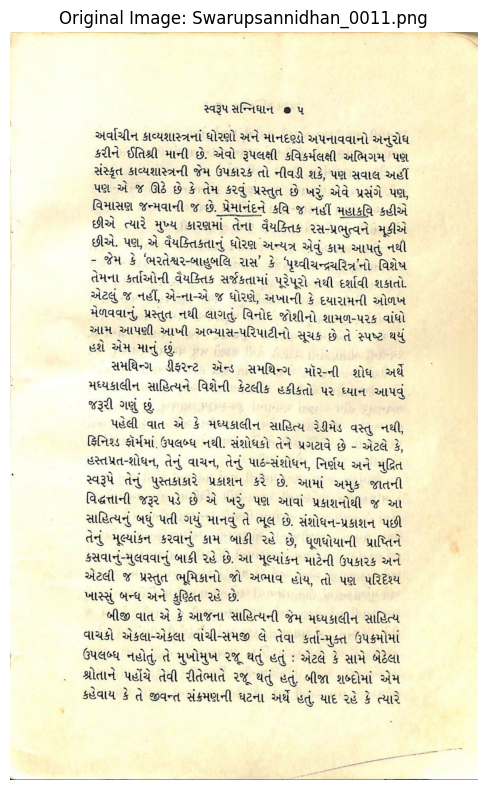


--- Raw Ground Truth (from initial OCR) ---
સ્વરૂપ સન્નિઘાન 9 પ

અર્વાચીન કાવ્યશાસ્ત્રનાં ધોરણો અને માનદણ્ડો અપનાવવાનો અનુરોધ
કરીને ઈતિશ્રી માની છે. એવો રૂપલક્ષી કવિકર્મલક્ષી અભગમ પણ
સંસ્કૃત કાવ્યશાસ્ત્રની જેમ ઉપકારક તો નીવડી શકે, પણ સવાલ અહીં
પણ એ જ ઊઠે છે કે તેમ કરવું પ્રસ્‍તુત છે ખરું એવે પ્રસંગે પણ,
વિમાસણ જન્મવાની જ છે. પ્રેમાનંદને કવિ જ નહીં મહાકવિ કહીએ
છીએ ત્યારે મુખ્ય કારણમાં તેના વૈયક્તિક રસ-પ્રભુત્વને મૂકીએ
છીએ. પણ, એ વૈયક્તિકતાનું ધોરણ અન્યત્ર એવું કામ આપતું નથી
- જેમ કે “ભરતેશ્વર-બાહુબલિ રાસ કે પૃથ્વીચન્દ્રચરિત્ર'નો વિશેષ
તેમના કર્તાઓની વૈયક્તિક સર્જકતામાં પૂરેપૂરો નથી દર્શાવી શકાતો.
એટલું જ નહીં, એ-ના-એ જ ધોરણે, અખાની કે દયારામની ઓળખ
મેળવવાનું, પ્રસ્‍તુત નથી લાગતું. વિનોદ જોશીનો શામળ-પરક વાંધો
આમ આપણી આખી અભ્યાસ-પરિપાટીનો સૂચક છે તે સ્પષ્ટ થયું
હશે એમ માનું છું. ઃ

સમથિન્ગ ડીફરન્ટ એન્ડ સમથિન્ગ મૉર-ની શોધ અર્થે
મધ્યકાલીન સાહિત્યને વિશેની કેટલીક હકીકતો પર ઘ્યાન આપવું
જરૂરી ગણું છું.

પહેલી વાત એ કે મધ્યકાલીન સાહિત્ય રેડીમેડ વસ્તુ નથી,
ફિનિશ્ડ ફોર્મમાં, ઉપલબ્ધ નથી. સંશોધકો ત

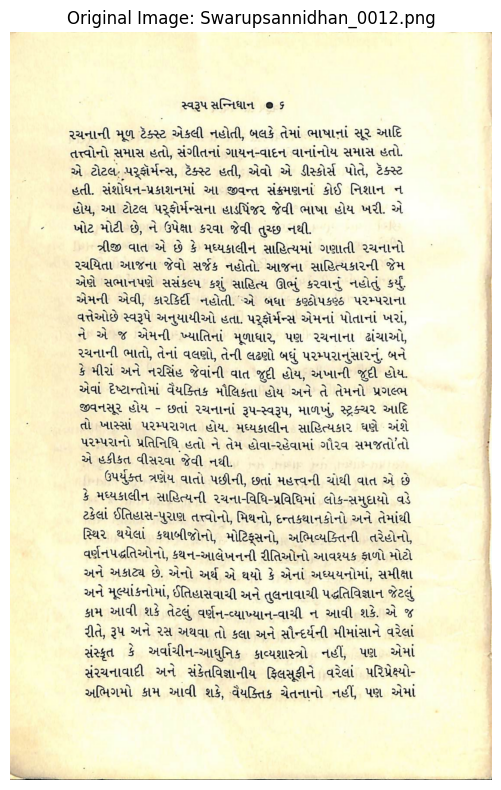


--- Raw Ground Truth (from initial OCR) ---
સ્વરૂપ સન્નિઘાન ૦ ૬

રચનાની મૂળ (ટૅક્સ્ટ એકલી નહોતી, બલકે તેમાં ભાષાનાં સૂર આદિ
તત્ત્વોનો સમાસ હતો, સંગીતનાં ગાયન-વાદન વાનાંનોય સમાસ હતો.
એ ટોટલ, પર્ફોર્મન્સ, ટૅક્સ્ટ હતી, એવો એ ડીસ્કોર્સ પોતે, ટૅક્સ્ટ
હતી. સંશોધન-પ્રકાશનમાં આ જીવન્ત સંક્રમણના કોઈ નિશાન ન
હોય, આ ટોટલ પર્ફોર્મન્સના હાડપિંજર જેવી ભાષા હોય ખરી. એ
ખોટ મોટી છે, ને ઉપેક્ષા કરવા જેવી તુચ્છ નથી.

ત્રીજી વાત એ છે કે મઘ્યકાલીન સાહિત્યમાં ગણાતી રચનાનો
રચયિતા આજના જેવો સર્જક નહોતો. આજના સાહિત્યકારની જેમ
એણે સભાનપણે સસંકલ્પ કશું સાહિત્ય ઊભું કરવાનું નહોતું કર્યુ.
એમની એવી, કારકિર્દી નહોતી. “એ બધા કણ્ઠોપકણ્ઠ પરમ્પરાના
વત્તેઓછે સ્વરૂપે અનુયાયીઓ હતા. પર્ફોર્મન્સ એમનાં પોતાનાં ખરાં,
ને એ જ એમની ખ્યાતિનાં મૂળાધારુ પણ રચનાના ઢાંચાઓ,
રચનાની ભાતો, તેનાં વલણો, તેની લઢણો બધું પરમ્પરાનુસારનું. બને
કે મીરાં અને નરસૅંહ જેવાંની વાત જૂદી હોય, અખાની જૂદી હોય.
એવાં દેષ્ટાન્તોમાં વૈયક્તિક મૌલિકતા હોય અને તે તેમનો પ્રગલ્ભ
જીવનસૂર હોય - છતાં રચનાનાં રૂપ-સ્વરૂપ, માળખું, સ્ટ્રક્ચર આદિ

તો ખાસ્સાં પરમ્પરાગત હો

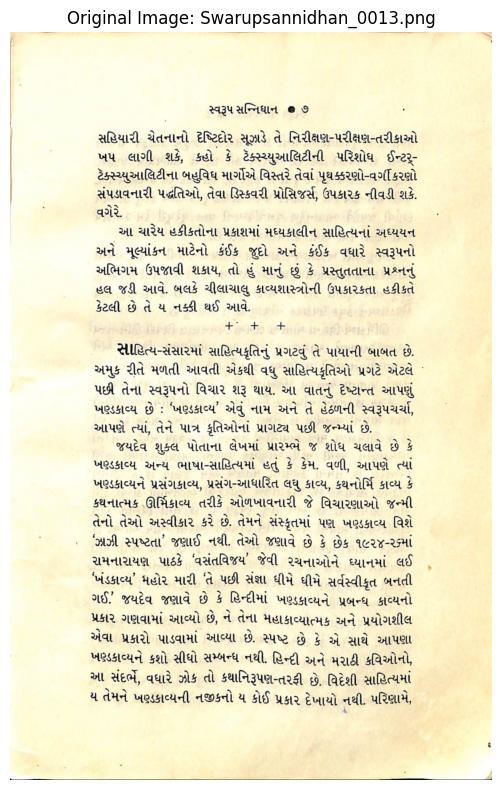


--- Raw Ground Truth (from initial OCR) ---
સ્વરૂપ સન્નિધાન 9 ૭

સહિયારી ચેતનાનો દષ્ટિદોર સૂઝાડે તે નિરીક્ષણ-પરીક્ષણ-તરીકાઓ
ખપ લાગી શકે, કહો કે ટૅક્સ્ચ્ચુઆલિટીની પરિશોધ ઈન્ટર્‌-
ટૅક્સ્ચ્ચયુઆલિટીના બહુવિધ માર્ગોએ વિસ્તરે તેવાં પૃથક્કરણો-વર્ગીકરણો
સંપડાવનારી પદ્ધતિઓ, તેવા ડિસ્કવરી પ્રોસિજર્સ, ઉપકારક નીવડી શકે.
વગેરે.

આ ચારેય હકીકતોના પ્રકાશમાં મધ્યકાલીન સાહિત્યનાં અધ્યયન
અને મૂલ્યાંકન માટેનો કંઈક જુદો અને કંઈક વધારે સ્વરૂપનો
અભિગમ ઉપજાવી શકાય, તો હું માનું છું કે પ્રસ્‍તુતતાના પ્રશ્નનું
હલ જડી આવે. બલકે ચીલાચાલુ કાવ્યશાસ્ત્રોની ઉપકારકતા હકીકતે
કેટલી છે તે ય નક્કી થઈ આવે.

-" 4 4

સાહિત્ય-સંસારમાં સાહિત્યકૃતિનું પ્રગટવું તે પાયાની બાબત છે.
અમુક રીતે મળતી આવતી એકથી વધુ સાહિત્યકૂતિઓ પ્રગટે એટલે '
પછી તેના સ્વરૂપનો વિચાર શરૂ થાય. આ વાતનું દેષ્ટાન્ત આપણું
ખણ્ડકાવ્ય છે : “ખણ્ડકાવ્ય' એવું નામ અને તે હેઠળની સ્વરૂપચર્ચા,
આપણે ત્યાં, તેને પાત્ર કૃતિઓનાં પ્રાગટ્ય પછી જન્મ્યાં છે.

જયદેવ શુક્લ પોતાના લેખમાં પ્રારમ્ભે જ શોધ ચલાવે છે કે
ખણ્ડકાવ્ય અન્ય ભાષા-સાહિત્યમાં હતું કે કેમ. વળી, આપણે ત્યાં
ખણ્

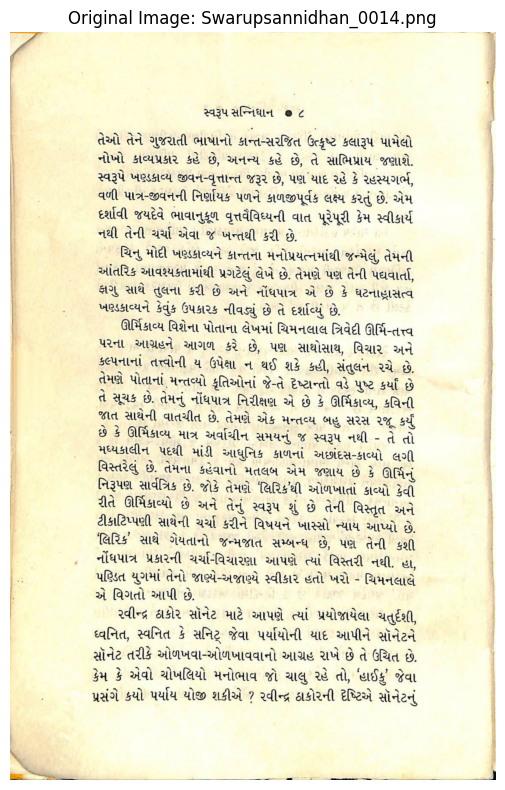


--- Raw Ground Truth (from initial OCR) ---
|... . ..:. કી વારા

સ્વરૂપ સસ્તિઘાન 9 ૮

તેઓ તેને ગુજરાતી ભાષાનો કાન્ત-સરજેત ઉત્કૃષ્ટ કલારૂપ પામેલો
નોખો કાવ્યપ્રકાર કહે છે, અનન્ય કહે છે, તે સાભિપ્રાય જણાશે.
સ્વરૂપે ખણ્ડકાવ્ય જીવન-વૃત્તાન્ત જરૂર છે, પણ યાદ રહે કે રહસ્યગર્ભ,
વળી પાત્ર-જીવનની નિર્ણાયક પળને કાળજીપૂર્વક લક્ષ્ય કરતું છે. એમ
દર્શાવી જયદેવે ભાવાનુકૂળ વૃત્તવૈવિધ્યની વાત પૂરેપૂરી કેમ સ્વીકાર્ય
નથી તેની ચર્ચા એવા જ ખત્તથી કરી છે.

ચિનુ મોદી ખણ્ડકાવ્યને કાન્તના મનોપ્રયત્નમાંથી જન્મેલું, તેમની
આંતરિક આવશ્યકતામાંથી પ્રગટેલું લેખે છે. તેમણે પણ તેની પદ્યવાર્તા,
ફાગુ સાથે તુલના કરી છે અને નોંધપાત્ર એ છે કે ઘટનાહ્ઘાસત્વ
ખણ્ડકાવ્યને કેવુંક ઉપકારક નીવડ્યું છે તે દર્શાવ્યું છે.

ઊર્મિકાવ્ય વિશેના પોતાના લેખમાં ચિમનલાલ ત્રિવેદી ઊર્ષિ-તત્ત્વ
પરના આગ્રહને આગળ કરે છે, પણ સાથોસાથ, વિચાર અને
કલ્પનાના તત્ત્વોની ય ઉપેક્ષા ન થઈ શકે કહી, સંતુલન રચે છે.
તેમણે પોતાનાં મન્તવ્યો કૃતિઓનાં જે-તે દેષ્ટાન્તો વડે પુષ્ટ કર્યા છે
તે સૂચક છે. તેમનું નોંધપાત્ર નિરીક્ષણ એ છે કે ઊર્મિકાવ્ય, કવિની
જાત સાથેની વાતચીત છ

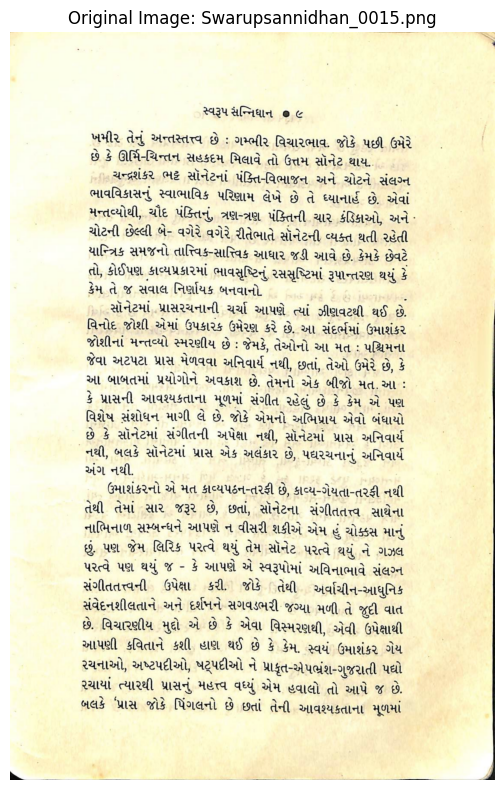


--- Raw Ground Truth (from initial OCR) ---
સ્વરૂપ સન્નિધાન 9 ૯

ખમીર તેનું અન્તસ્તત્ત્વ છે : ગમ્ભીર વિચારભાવ. જોકે પછી ઉમેરે
છે કે ઊર્મિ-ચિન્તન સહકદમ મિલાવે તો ઉત્તમ સોનેટ થાય..
ચન્દ્રશંકર ભટ્ટ સૉોનેટનાં પંક્તિ-વિભાજન અને ચોટને સંલગ્ન
ભાવવિકાસનું સ્વાભાવિક પરિણામ લેખે છે તે ધ્યાનાર્હ છે. એવાં
મન્તવ્યોથી, ચૌદ પંક્તિનું, ત્રણ-ત્રણ પંક્તિની ચાર કંડિકાઓ, અને *
ચોટની છેલ્લી બે- વગેરે વગેરે રીતેભાતે સૉનેટની વ્યક્ત થતી રહેતી
યાન્ત્રિક સમજનો તાત્તિક-સાસ્વિક આધાર જડી આવે છે. કેમકે છેવટે

તો, કોઈપણ કાવ્યપ્રકારમાં ભાવસૃષ્ટિનું રસસૃષ્ટિમાં રૂપાન્તરણ થયું કે
કેમ તે જ સવાલ નિર્ણાયક બનવાનો. ઝે

સૉનેટમાં પ્રાસરચનાની ચર્ચા આપણે ત્યાં ઝીણવટથી થઈ છે.
વિનોદ જોશી એમાં ઉપકારક ઉમેરણ કરે છે. આ સંદર્ભમાં ઉમાશંકર
જોશીનાં મન્તવ્યો સ્મરણીય છે : જેમકે, તેઓનો આ મત : પશ્ચિમના
જેવા અટપટા પ્રાસ મેળવવા અનિવાર્ય નથી, છતાં, તેઓ ઉમેરે છે, કે
આ બાબતમાં પ્રયોગોને અવકાશ છે. તેમનો એક બીજો મત. આ :
કે પ્રાસની આવશ્યકતાના મૂળમાં સંગીત રહેલું છે કે કેમ એ પણ
વિશેષ સંશોધન માગી લે છે. જોકે એમનો અભિપ્રાય એવો બંધાયો

જ

છે કે સૉનેટમા

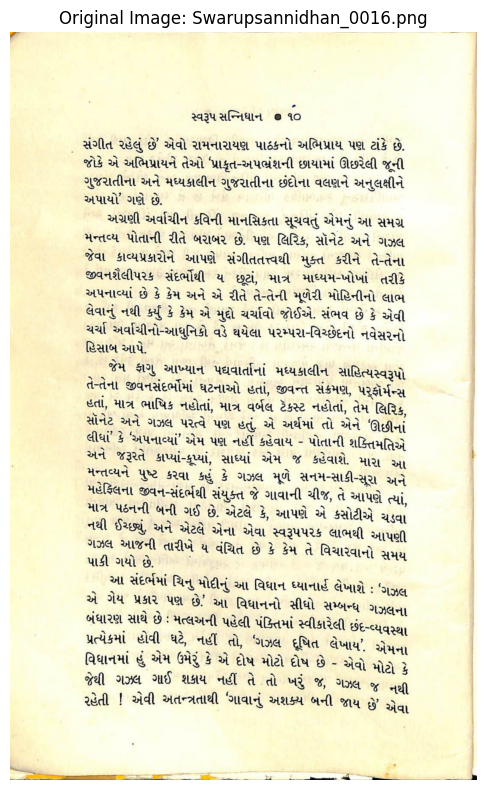


--- Raw Ground Truth (from initial OCR) ---
સ્વરૂપ સન્નિધાન 9 ૧૦

_ સંગીત રહેલું છે એવો રામનારાયણ પાઠકનો અભિપ્રાય પણ ટૉકે છે.
જોકે એ અભિપ્રાયને તેઓ 'પ્રાકૃત-અપભ્રંશની છાયામાં ઊછરેલી જૂની
ગુજરાતીના અને મધ્યકાલીન ગુજરાતીના છંદોના વલણને અનૂલક્ષીને
અપાયો' ગણે છે.

અગ્રણી અર્વાચીન કવિની માનસિકતા સૂચવતું એમનું આ સમગ્ર
મન્તવ્ય પોતાની રીતે બરાબર છે. પણ લિરિક, સૉનેટ અને ગઝલ
જેવા કાવ્યપ્રકારોને આપણે સંગીતતત્ત્વથી મુક્ત કરીને તે-તેના
જીવનશૈલીપરક સંદર્ભોથી ય છૂટાં, માત્ર માધ્યમ-ખોખાં તરીકે
અપનાવ્યાં છે કે કેમ અને એ રીતે તે-તેની મૂળેરી મોહિનીનો લાભ
લેવાનું નથી કર્યું કે કેમ એ મુદ્દો ચર્ચાવો જોઈએ. સંભવ છે કે એવી
ચર્ચા અર્વાચીનો-આધુનિકો વડે થયેલા પરમ્પરા-વિચ્છેદનો નવેસરનો
[હિસાબ આપે.

જેમ ફાગુ આખ્યાન પઘવાર્તાનાં મધ્યકાલીન સાહિત્યસ્વરૂપો
તે-તેના જીવનસંદર્ભોમાં ઘટનાઓ હતાં, જીવન્ત સંક્રમણ, પર્ફોર્મન્સ
હતાં, માત્ર ભાષિક નહોતાં, માત્ર વર્બલ ટૅકસ્ટ નહોતાં, તેમ લિરિક,
સૉનેટ અને ગઝલ પરત્વે પણ હતું. એ અર્થમાં તો એને ઊછીનાં
લીધાં' કે “અપનાવ્યાં' એમ પણ નહીં કહેવાય - પોતાની શક્તિમતિએ
અને જરૂરતે કાપ્યાં-કૃપ્યાં,

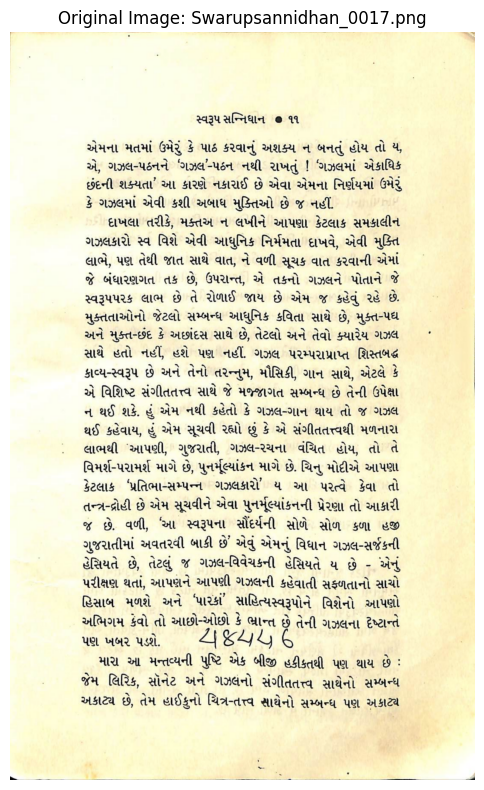


--- Raw Ground Truth (from initial OCR) ---
સ્વરૂપ સન્નિધાન ૦ ૧૧

એમના મતમાં ઉમેરું કે પાઠ કરવાનું અશક્ય ન બનતું હોય તો ય,
એ, ગઝલ-પઠનને 'ગઝલ-પઠન નથી રાખતું ! ગઝલમાં એકાધિક
છંદની શક્યતા' આ કારણે નકારાઈ છે એવા એમના નિર્ણયમાં ઉમેરું
કે ગઝલમાં એવી કશી અબાધ મુક્તિઓ છે જ નહીં.

દાખલા તરીકે, મક્તઅ ન લખીને આપણા કેટલાક સમકાલીન
ગઝલકારો સ્વ વિશે એવી આધુનિક નિર્મમતા દાખવે, એવી મુક્તિ
લાભે, પણ તેથી જાત સાથે વાત, ને વળી સૂચક વાત કરવાની એમાં
જે બંધારણગત તક છે, ઉપરાન્ત, એ તકનો ગઝલને પોતાને જે
સ્વરૂપપરક લાભ છે તે રોળાઈ જાય છે એમ જ કહેવું રહે છે.
મુક્તતાઓનો જેટલો સમ્બન્ધ આધુનિક કવિતા સાથે છે, મુક્ત-પધ
અને મુક્ત-છંદ કે અછાંદસ સાથે છે, તેટલો અને તેવો ક્યારેય ગઝલ
સાથે હતો નહીં, હશે પણ નહીં. ગઝલ પરમ્પરાપ્રાપ્ત શિસ્તબદ્ધ
કાવ્ય-સ્વરૂપ છે અને તેનો તરન્નુમ, મૌસિકી, ગાન સાથે, એટલે કે
એ વિશિષ્ટ સંગીતતત્ત્વ સાથે જે મજ્જાગત સમ્બન્ધ છે તેની ઉપેક્ષા
ન થઈ શકે. હું એમ નથી કહેતો કે ગઝલ-ગાન થાય તો જ ગઝલ
થઈ કહેવાય, હું એમ સૂચવી રહ્યો છું કે એ સંગીતતત્ત્વથી મળનારા
લાભથી 'આપણી, ગુજરાતી, ગઝલ-રચના વંચિત હોય, તો તે
વિમર્શ-પરા

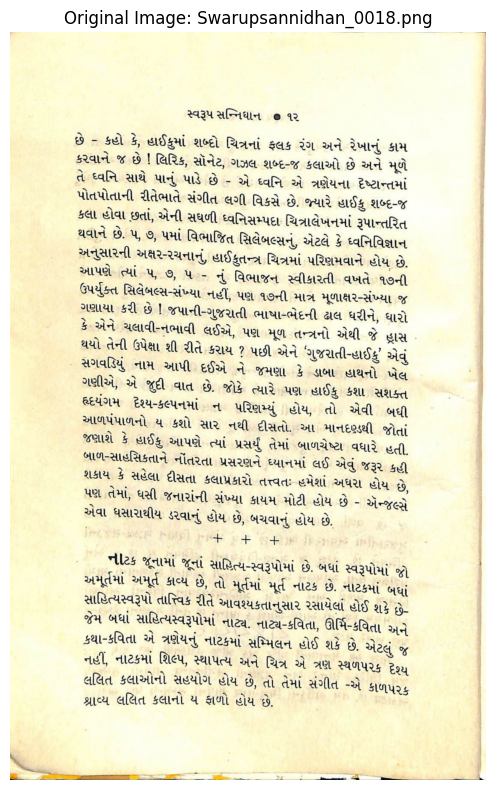


--- Raw Ground Truth (from initial OCR) ---
સ્વરૂપ સન્નિધઘાન ૦ ૧૨
છે - કહો કે,

હાઈકુમાં શબ્દો ચિત્રનાં ફલક રંગ અને રેખાનું કામ
કરવાને જ છે

છ ! લિરિક, સોનેટ, ગઝલ શબ્દ-જ કલાઓ છે અને મૂળે
તે ઘ્વનિ સાથે પાનું પાડે છે - એ ઘ્વનિ એ ત્રણેયના દેષ્ટાન્તમાં
પોતપોતાની રીતેભાતે સંગીત લગી વિકસે છે. જ્યારે હાઈકુ શબ્દ-જ
કલા હોવા છતાં, એની સઘળી ઘ્વનિસમ્પદાઃ ચિત્રાલેખનમાં રૂપાન્તરેત
થવાને છે. ૫, ૭, પમાં વિભાજિત સિલેબલ્સનું, એટલે કે ધ્વનિવિજ્ઞાન
અનૂસારની અક્ષર-રચનાનું, હાઈક્તન્ત્ર ચિત્રમાં પરિણમવાને હોય છે.
જાપણેકાત્યાંકસકાઝ પહ નું: વિભાજન સ્ધીકારતી,વપ્મેતે ૧૭ની
ઉપર્યુક્ત સિલેબલ્સ-સંખ્યા નહીં, પણ ૧૭ની માત્ર મૂળાક્ષર-સંખ્યા જ
ગણાયા કરી છે ! જપાની-ગુજરાતી ભાષા-ભેદની ઢાલ ધરીને, ધારો
કે એને ચલાવી-નભાવી લઈએ, પણ મૂળ તન્ત્રનો એથી જે હ્રાસ -
થયો તેની ઉપેક્ષા શી રીતે કરાય ? પછી એને 'ગુજરાતી-હાઈકુ' એવું
: સગવડિયું નામ આપી દઈએ ને જમણા કે ડાબા હાથનો ખેલ

ગણીએ, એ જુદી વાત છે. જોકે ત્યારે પણ હાઈકુ કશા સશક્ત
હૃદયંગમ દેશ્ય-કલ્પનમાં ન પરિણમ્યું હોય, તો એવી બઘી
આળપંપાળનો ય કશો સાર નથી દીસતો. આ માનદણ્ડથી જોતાં
જણાશે કે 

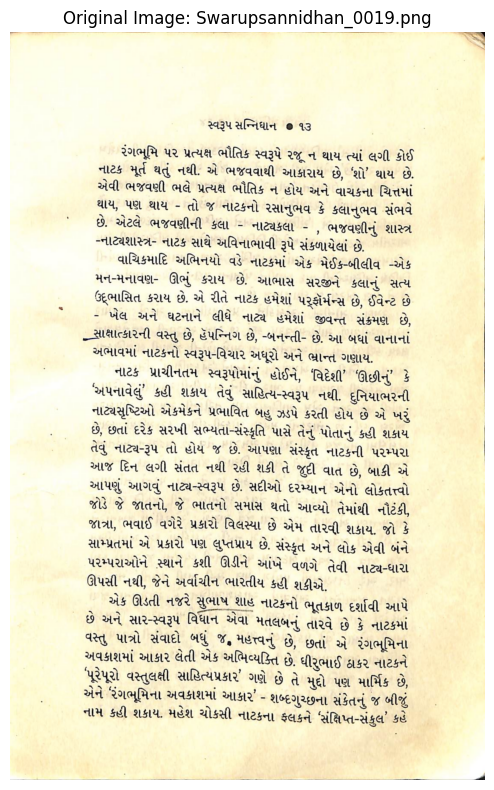


--- Raw Ground Truth (from initial OCR) ---
સ્વરૂપ સન્નિધઘાન 9 ૧૩

રંગભૂમિ પર પ્રત્યક્ષ ભૌતિક સ્વરૂપે રજૂ ન થાય ત્યાં લગી કોઈ
નાટક મૂર્ત થતું નથી. એ ભજવવાથી આકારાય છે, 'શો' થાય છે.
એવી ભજવણી ભલે પ્રત્યક્ષ ભૌતિક ન હોય અને વાચકના ચિત્તમાં
થાય, પણ થાય - તો જ નાટકનો રસાનુભવ કે ક્લાનુભવ સંભવે
છે. એટલે ભજવણીની કલા - નાટ્યકલા - , ભજવણીનું શાસ્ત્ર
-નાટ્યશાસ્ત્ર- નાટક સાથે અવિનાભાવી રૂપે સંકળાયેલાં છે.
વાચિકમાદિ અભિનયો વડે નાટકમાં એક મેઈક-બીલીવ -એક
મન-મનાવણ- ઊભું કરાય છે. આભાસ સરજીને કલાનું સત્ય
ઉદ્ભાસિત કરાય છે. એ રીતે નાટક હમેશાં પર્ફોર્મન્સ છે, ઈવેન્ટ છે
- ખેલ અને ઘટનાને લીધે નાટ્ય હમેશાં જીવન્ત સંક્રમણ છે,
--સાક્ષાત્કારની વસ્તુ છે, હૅપન્નિગ છે, -બનન્તી- છે. આ બધાં વાનાનાં
અભાવમાં નાટકનો સ્વરૂપ-વિચાર અધૂરો અને ભ્રાન્ત ગણાય.
નાટક પ્રાચીનતમ સ્વરૂપોમાંનું હોઈને, 'વિદેશી' 'ઊછીનું કે
અપનાવેલું' કહી શકાય તેવું સાહિત્ય-સ્વરૂપ નથી. દુનિયાભરની
નાટ્યસૃષ્ટિઓ એકમેકને પ્રભાવિત બહુ ઝડપે કરતી હોય છે એ ખરું
છે, છતાં દરેક સરખી સભ્યતા-સંસ્કૃતિ પાસે તેનું પોતાનું કહી શકાય
તેવું નાટ્ય-રૂપ તો હોય જ છે. આપણા સંસ

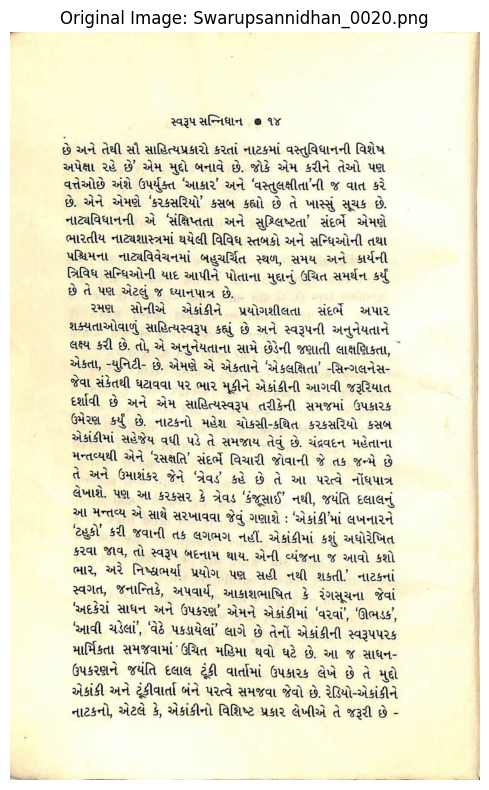


--- Raw Ground Truth (from initial OCR) ---
સ્વરૂપ સન્નિધાન 9 ૧૪

છે અને તેથી સૌ સાહિત્યપ્રકારો કરતાં નાટકમાં વસ્તૃવિધાનની વિશેષ
અપેક્ષા રહે છે” એમ મુદ્દો બનાવે છે. જોકે એમ કરીને તેઓ પણ
વત્તેઓછે અંશે ઉપર્યુક્ત 'આકાર' અને “વસ્તૂલક્ષીતા'ની જ વાત કરે
છે. એને એમણે 'કરકસરિયો' કસબ કહ્યો છે તે ખાસ્સું સૂચક છે.
નાટ્યવિધાનની એ સંક્ષિપ્તતા અને સુશ્લિષ્ટતા' સંદર્ભે એમણે
ભારતીય નાટ્યશાસ્ત્રમાં થયેલી વિવિધ સ્તબકો અને સંન્ધઓની તથા
પશ્ચિમના નાટ્યવિવેચનમાં બહુચર્ચિત સ્થળ, સમય અને કાર્યની
ત્રિવિધ સંન્ધિઓની યાદ આપીને પોતાના મુદ્દાનું ઉચિત સમર્થન કર્યું
છે તે પણ એટલું જ ધ્યાનપાત્ર છે.
રમણ સોનીએ એકાંકીને પ્રયોગશીલતા સંદર્ભે અપાર
શક્યતાઓવાળું સાહિત્યસ્વરૂપ કહ્યું છે અને સ્વરૂપની અનુનેયતાને
લક્ષ્ય કરી છે. તો, એ અનુનેયતાના સામે છેડેની જણાતી લાક્ષણિકતા, ”
એકતા, -યુનનિટી- છે. એમણે એ એકતાને “એકલક્ષિતા' -સિન્ગલનેસ-
જેવા સંકેતથી ઘટાવવા પર ભાર મૂકીને એકાંકીની આગવી જરૂરિયાત
દર્શાવી છે અને એમ સાહિત્યસ્વરૂપ તરીકેની સમજમાં ઉપકારક
ઉમેરણ કર્યું છે. નાટકનો મહેશ ચોકસી-કાથેત કરક્સારૈયો કસબ
એકાંકીમાં સહેજેય વધી પડે તે સમજા

In [ ]:
# Cell 18: Compare Original Image, Raw GT, and Cleaned GT (Updated)
# This cell helps in verifying the automated pre-cleaning by displaying
# the original image alongside its raw OCR output and the pre-cleaned ground truth,
# reading the ground truth content directly from the files.

import matplotlib.pyplot as plt
from PIL import Image
import os
import re # Already imported in previous cells, but good to ensure

def compare_ground_truths(dataset_manager, image_numbers_to_compare):
    """
    Displays the original image, its raw OCR ground truth, and its cleaned ground truth
    for a specified list of image numbers, reading content directly from files.

    Args:
        dataset_manager: An instance of your DatasetManager class.
        image_numbers_to_compare (list): A list of integer image numbers (e.g., [4, 25, 99, 1, 17, 82]).
    """
    print("\n=== Comparing Original Image, Raw Ground Truth, and Cleaned Ground Truth ===")
    print("Review these comparisons to assess the effectiveness of the automated pre-cleaning.")

    # Create a mapping from image number to its info for easy lookup
    image_info_map = {}
    for split_name in dataset_manager.splits:
        for img_info in dataset_manager.splits[split_name]:
            image_info_map[img_info['number']] = img_info

    # Define paths for ground truth folders
    initial_gt_base_path = dataset_manager.ground_truth_path
    cleaned_gt_base_path = os.path.join(dataset_manager.base_path, 'ground_truth_cleaned')

    for img_num in image_numbers_to_compare:
        img_info = image_info_map.get(img_num)

        if not img_info:
            print(f"\n--- Image Number {img_num} Not Found in Dataset Splits. Skipping. ---")
            continue

        filename = img_info['filename']
        base_name = os.path.splitext(filename)[0]

        # Determine the split name for the current image to get correct GT paths
        # This assumes the image's path contains the split name in its directory structure
        split_name_for_image = None
        for s_name, s_list in dataset_manager.splits.items():
            if any(item['number'] == img_num for item in s_list):
                split_name_for_image = s_name
                break

        if not split_name_for_image:
            print(f"\n--- Could not determine split for Image Number {img_num}. Skipping. ---")
            continue

        # Correctly define img_path here by using img_info['path'] directly
        # as the DatasetManager already stores the full path to the image.
        img_path = img_info['path']

        raw_gt_filepath = os.path.join(initial_gt_base_path, split_name_for_image, f"{base_name}.txt")
        cleaned_gt_filepath = os.path.join(cleaned_gt_base_path, split_name_for_image, f"{base_name}.txt")

        print(f"\n\n--- Comparison for Image: {filename} (Number: {img_num}) ---")

        # Display Original Image
        try:
            img = Image.open(img_path)
            fig, ax = plt.subplots(1, 1, figsize=(10, 8))
            ax.imshow(img)
            ax.set_title(f"Original Image: {filename}")
            ax.axis('off')
            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"Error loading image {filename}: {e}")
            # Ensure the figure is closed even if image loading fails
            if 'fig' in locals() and fig is not None:
                plt.close(fig)

        # Read and Print Raw Ground Truth
        raw_gt_content = "Raw Ground Truth file not found or empty."
        try:
            if os.path.exists(raw_gt_filepath):
                with open(raw_gt_filepath, 'r', encoding='utf-8') as f:
                    content = f.read().strip()
                    if content:
                        raw_gt_content = content
            else:
                raw_gt_content = f"Raw Ground Truth file missing: {raw_gt_filepath}"
        except Exception as e:
            raw_gt_content = f"Error reading Raw GT file: {e}"

        print("\n--- Raw Ground Truth (from initial OCR) ---")
        print(raw_gt_content)
        print("-------------------------------------------\n")

        # Read and Print Cleaned Ground Truth
        cleaned_gt_content = "Cleaned Ground Truth file not found or empty."
        try:
            if os.path.exists(cleaned_gt_filepath):
                with open(cleaned_gt_filepath, 'r', encoding='utf-8') as f:
                    content = f.read().strip()
                    if content:
                        cleaned_gt_content = content
            else:
                cleaned_gt_content = f"Cleaned Ground Truth file missing: {cleaned_gt_filepath}"
        except Exception as e:
            cleaned_gt_content = f"Error reading Cleaned GT file: {e}"

        print("\n--- Cleaned Ground Truth (after automated pre-cleaning) ---")
        print(cleaned_gt_content)
        print("-----------------------------------------------------------\n")

# --- How to use this function ---
# Define the list of image numbers you want to compare
# These are the first 10 images by sorted number, and the ones you requested
images_to_check = [11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

# Call the function with your dataset_manager instance and the list of image numbers
compare_ground_truths(dataset_manager, images_to_check)

print("\n--- Comparison Complete ---")
print("Proceed with manual review and correction of all files in `ground_truth_cleaned`.")

Prepared the dataset by initially placing all images in a single folder. The dataset was then partitioned into train (70%), validation (15%), and test (15%) splits using a stratified sampling approach based on image quality metrics like mean brightness and contrast. This method aimed to ensure representative subsets, with a fallback to simple random splitting if stratification wasn't feasible. The details of these splits are precisely recorded in the data_splits.json file.

For initial text extraction, an off-the-shelf Optical Character Recognition (OCR) engine was utilized to generate the raw ground truth. Recognizing the specific challenges posed by Gujarati script, we then engaged in an iterative process to identify and correct common OCR errors, such as misread page numbers (e.g., dots appearing as '9's or '0's) and various forms of gibberish.

# 2. Advanced Image Processing

In [ ]:
!pip install torch torchvision torchaudio

In [ ]:
# Simple Document Restoration using Stable Diffusion Image-to-Image
!pip install diffusers transformers torch torchvision opencv-python-headless matplotlib pillow

import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
from diffusers import StableDiffusionImg2ImgPipeline

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/6 [00:00<?, ?it/s]

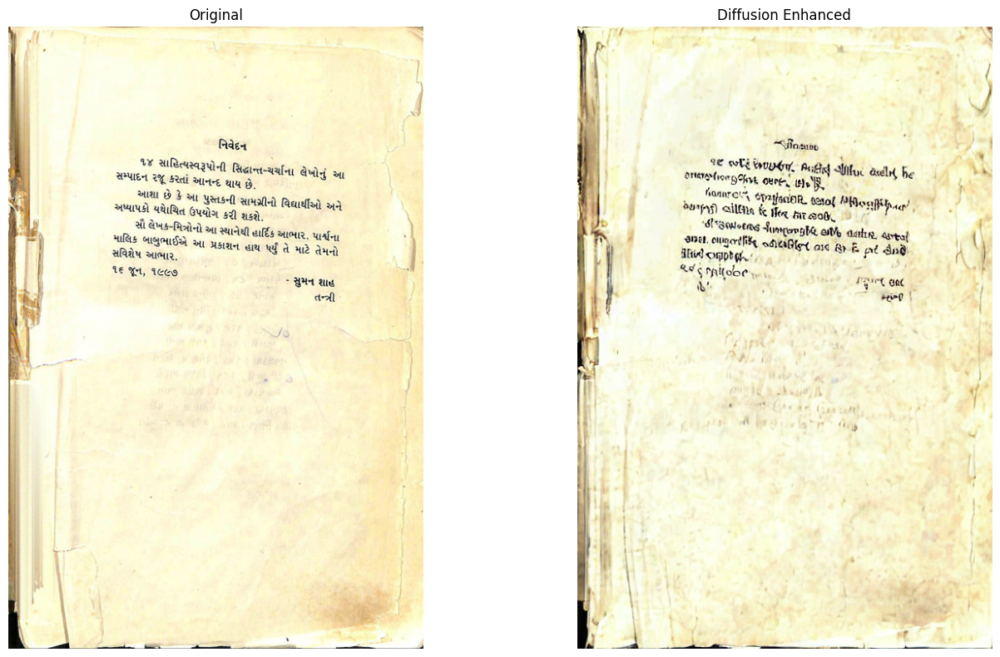

In [ ]:
# Load diffusion model
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32
)
pipe = pipe.to("cuda" if torch.cuda.is_available() else "cpu")

def restore_document(image_path):
    # Load image
    img = cv2.imread(image_path)
    original_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Convert to PIL and resize
    pil_img = Image.fromarray(original_rgb)
    pil_img = pil_img.resize((512, 768))  # Good for document pages

    # Enhance with diffusion
    prompt = "high quality clean document page, sharp text, white background, restored historical document"
    enhanced_pil = pipe(
        prompt=prompt,
        image=pil_img,
        strength=0.3,  # Light enhancement
        guidance_scale=7.5,
        num_inference_steps=20
    ).images[0]

    enhanced_rgb = np.array(enhanced_pil)

    # Display side by side
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 8))

    ax1.imshow(pil_img)
    ax1.set_title('Original')
    ax1.axis('off')

    ax2.imshow(enhanced_rgb)
    ax2.set_title('Diffusion Enhanced')
    ax2.axis('off')

    plt.tight_layout()
    plt.show()

    return np.array(pil_img), enhanced_rgb

# Usage - replace with your image path
image_path = "/content/drive/MyDrive/VLM_Assignment/images/Swarupsannidhan_0005.png"
original, enhanced = restore_document(image_path)

In [ ]:
# Simple Document Restoration - Memory Optimized
!pip install torch torchvision opencv-python-headless matplotlib pillow requests

import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import requests
from io import BytesIO

# Clear GPU memory if available
if torch.cuda.is_available():
    torch.cuda.empty_cache()


## GAN Tried a couple of off the shelf GAN/Diffusion models - chose DocRes (2024)
DocRes: A Generalist Model Toward Unifying Document Image Restoration Tasks
(https://arxiv.org/abs/2405.04408)



In [ ]:
!pip install gradio_client

In [ ]:
from gradio_client import Client, file
import os
from tqdm import tqdm
import shutil

# Folder paths
input_folder = "/content/drive/MyDrive/VLM_Assignment/images"
output_folder = "/content/drive/MyDrive/VLM_Assignment/GAN_enhanced"
os.makedirs(output_folder, exist_ok=True)

# Initialize Hugging Face Gradio client once
client = Client("qubvel-hf/documents-restoration")

# Process all 100 images
for i in tqdm(range(1, 101)):
    # Format image filename with leading zeros (0001, 0002, ..., 0100)
    img_name = f"Swarupsannidhan_{i:04d}.png"
    input_path = os.path.join(input_folder, img_name)

    # Skip if input image doesn't exist (just in case)
    if not os.path.isfile(input_path):
        print(f"Skipped missing file: {input_path}")
        continue

    # Run restoration tasks
    result_path = client.predict(
        image=file(input_path),
        tasks=["deshadowing", "appearance", "deblurring", "binarization"],
        api_name="/run_tasks"
    )

    # Save restored image
    output_path = os.path.join(output_folder, img_name.replace(".png", "_restored.png"))
    shutil.copy(result_path, output_path)

Loaded as API: https://qubvel-hf-documents-restoration.hf.space ✔


 41%|████      | 41/100 [03:32<05:05,  5.18s/it]


AppError: 'You have exceeded your GPU quota (59s left vs. 60s requested). Sign-up on Hugging Face to get more quotas or retry in 23:52:09'

### Completed the rest 59 images using other email due to limited Free API -- copied output from Colab linked with Other email id

Loaded as API: https://qubvel-hf-documents-restoration.hf.space ✔
Processing images:   0%|          | 0/59 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/gradio_client/utils.py:1228: UserWarning: file() is deprecated and will be removed in a future version. Use handle_file() instead.
  warnings.warn(
Processing images:   2%|▏         | 1/59 [00:05<05:23,  5.58s/it]Restored and saved: Swarupsannidhan_0042.png
Processing images:   3%|▎         | 2/59 [00:09<04:26,  4.67s/it]Restored and saved: Swarupsannidhan_0043.png
Processing images:   5%|▌         | 3/59 [00:13<04:00,  4.30s/it]Restored and saved: Swarupsannidhan_0044.png
Processing images:   7%|▋         | 4/59 [00:17<03:46,  4.12s/it]Restored and saved: Swarupsannidhan_0045.png
Processing images:   8%|▊         | 5/59 [00:21<03:37,  4.02s/it]Restored and saved: Swarupsannidhan_0046.png
Processing images:  10%|█         | 6/59 [00:25<03:42,  4.20s/it]Restored and saved: Swarupsannidhan_0047.png
Processing images:  12%|█▏        | 7/59 [00:29<03:30,  4.05s/it]Restored and saved: Swarupsannidhan_0048.png
Processing images:  14%|█▎        | 8/59 [00:33<03:30,  4.13s/it]Restored and saved: Swarupsannidhan_0049.png
Processing images:  15%|█▌        | 9/59 [00:38<03:31,  4.23s/it]Restored and saved: Swarupsannidhan_0050.png
Processing images:  17%|█▋        | 10/59 [00:42<03:24,  4.17s/it]Restored and saved: Swarupsannidhan_0051.png
Processing images:  19%|█▊        | 11/59 [00:46<03:20,  4.17s/it]Restored and saved: Swarupsannidhan_0052.png
Processing images:  20%|██        | 12/59 [00:50<03:12,  4.09s/it]Restored and saved: Swarupsannidhan_0053.png
Processing images:  22%|██▏       | 13/59 [00:54<03:05,  4.03s/it]Restored and saved: Swarupsannidhan_0054.png
Processing images:  24%|██▎       | 14/59 [00:58<02:58,  3.97s/it]Restored and saved: Swarupsannidhan_0055.png
Processing images:  25%|██▌       | 15/59 [01:01<02:54,  3.96s/it]Restored and saved: Swarupsannidhan_0056.png
Processing images:  27%|██▋       | 16/59 [01:05<02:48,  3.92s/it]Restored and saved: Swarupsannidhan_0057.png
Processing images:  29%|██▉       | 17/59 [01:09<02:44,  3.91s/it]Restored and saved: Swarupsannidhan_0058.png
Processing images:  31%|███       | 18/59 [01:13<02:36,  3.83s/it]Restored and saved: Swarupsannidhan_0059.png
Processing images:  32%|███▏      | 19/59 [01:17<02:34,  3.85s/it]Restored and saved: Swarupsannidhan_0060.png
Processing images:  34%|███▍      | 20/59 [01:21<02:29,  3.83s/it]Restored and saved: Swarupsannidhan_0061.png
Processing images:  36%|███▌      | 21/59 [01:24<02:25,  3.82s/it]Restored and saved: Swarupsannidhan_0062.png
Processing images:  37%|███▋      | 22/59 [01:28<02:21,  3.83s/it]Restored and saved: Swarupsannidhan_0063.png
Processing images:  39%|███▉      | 23/59 [01:32<02:18,  3.85s/it]Restored and saved: Swarupsannidhan_0064.png
Processing images:  41%|████      | 24/59 [01:36<02:15,  3.87s/it]Restored and saved: Swarupsannidhan_0065.png
Processing images:  42%|████▏     | 25/59 [01:40<02:11,  3.88s/it]Restored and saved: Swarupsannidhan_0066.png
Processing images:  44%|████▍     | 26/59 [01:44<02:09,  3.94s/it]Restored and saved: Swarupsannidhan_0067.png
Processing images:  46%|████▌     | 27/59 [01:48<02:05,  3.91s/it]Restored and saved: Swarupsannidhan_0068.png
Processing images:  47%|████▋     | 28/59 [01:52<02:04,  4.00s/it]Restored and saved: Swarupsannidhan_0069.png
Processing images:  49%|████▉     | 29/59 [01:56<01:59,  4.00s/it]Restored and saved: Swarupsannidhan_0070.png
Processing images:  51%|█████     | 30/59 [02:00<01:56,  4.02s/it]Restored and saved: Swarupsannidhan_0071.png
Processing images:  53%|█████▎    | 31/59 [02:04<01:52,  4.01s/it]Restored and saved: Swarupsannidhan_0072.png
Processing images:  54%|█████▍    | 32/59 [02:08<01:45,  3.92s/it]Restored and saved: Swarupsannidhan_0073.png
Processing images:  56%|█████▌    | 33/59 [02:12<01:41,  3.90s/it]Restored and saved: Swarupsannidhan_0074.png
Processing images:  58%|█████▊    | 34/59 [02:15<01:36,  3.86s/it]Restored and saved: Swarupsannidhan_0075.png
Processing images:  59%|█████▉    | 35/59 [02:19<01:32,  3.85s/it]Restored and saved: Swarupsannidhan_0076.png
Processing images:  61%|██████    | 36/59 [02:23<01:29,  3.88s/it]Restored and saved: Swarupsannidhan_0077.png
Processing images:  63%|██████▎   | 37/59 [02:27<01:24,  3.84s/it]Restored and saved: Swarupsannidhan_0078.png
Processing images:  64%|██████▍   | 38/59 [02:31<01:20,  3.84s/it]Restored and saved: Swarupsannidhan_0079.png
Processing images:  66%|██████▌   | 39/59 [02:35<01:16,  3.85s/it]Restored and saved: Swarupsannidhan_0080.png
Processing images:  68%|██████▊   | 40/59 [02:38<01:12,  3.81s/it]Restored and saved: Swarupsannidhan_0081.png
Processing images:  69%|██████▉   | 41/59 [02:42<01:08,  3.83s/it]Restored and saved: Swarupsannidhan_0082.png
Processing images:  71%|███████   | 42/59 [02:47<01:08,  4.03s/it]Restored and saved: Swarupsannidhan_0083.png
Processing images:  73%|███████▎  | 43/59 [02:50<01:03,  3.95s/it]Restored and saved: Swarupsannidhan_0084.png
Processing images:  75%|███████▍  | 44/59 [02:55<01:00,  4.01s/it]Restored and saved: Swarupsannidhan_0085.png
Processing images:  76%|███████▋  | 45/59 [02:58<00:54,  3.92s/it]Restored and saved: Swarupsannidhan_0086.png
Processing images:  78%|███████▊  | 46/59 [03:02<00:51,  3.93s/it]Restored and saved: Swarupsannidhan_0087.png
Processing images:  80%|███████▉  | 47/59 [03:06<00:47,  3.94s/it]Restored and saved: Swarupsannidhan_0088.png
Processing images:  81%|████████▏ | 48/59 [03:10<00:42,  3.90s/it]Restored and saved: Swarupsannidhan_0089.png
Processing images:  83%|████████▎ | 49/59 [03:14<00:38,  3.90s/it]Restored and saved: Swarupsannidhan_0090.png
Processing images:  85%|████████▍ | 50/59 [03:18<00:35,  3.94s/it]Restored and saved: Swarupsannidhan_0091.png
Processing images:  86%|████████▋ | 51/59 [03:22<00:31,  3.95s/it]Restored and saved: Swarupsannidhan_0092.png
Processing images:  88%|████████▊ | 52/59 [03:26<00:27,  3.96s/it]Restored and saved: Swarupsannidhan_0093.png
Processing images:  88%|████████▊ | 52/59 [03:27<00:27,  3.99s/it]GPU quota exceeded — STOP this notebook, switch to another account or retry after 24 hours.



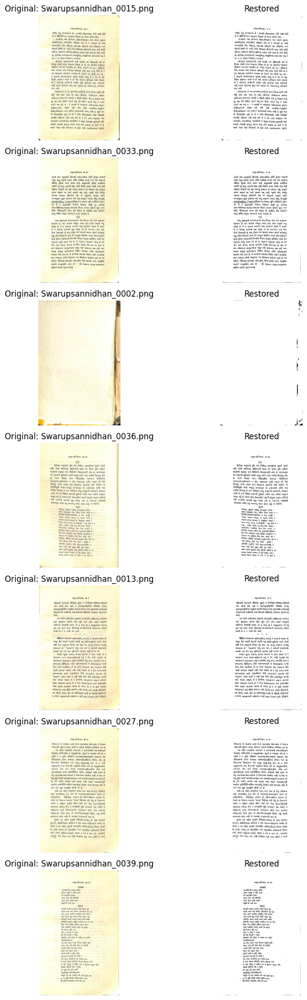

In [ ]:
import random
from PIL import Image
import matplotlib.pyplot as plt
import os

input_folder = "/content/drive/MyDrive/VLM_Assignment/images"
output_folder = "/content/drive/MyDrive/VLM_Assignment/GAN_enhanced"

# Pick 7 random images from first 39 (adjust number if you want)
sample_images = random.sample([f"Swarupsannidhan_{i:04d}.png" for i in range(1, 40)], 7)

fig, axes = plt.subplots(len(sample_images), 2, figsize=(10, 3 * len(sample_images)))

for idx, img_name in enumerate(sample_images):
    orig_path = os.path.join(input_folder, img_name)
    restored_path = os.path.join(output_folder, img_name.replace(".png", "_restored.png"))

    orig_img = Image.open(orig_path)
    restored_img = Image.open(restored_path) if os.path.isfile(restored_path) else None

    axes[idx, 0].imshow(orig_img)
    axes[idx, 0].set_title(f"Original: {img_name}")
    axes[idx, 0].axis('off')

    if restored_img:
        axes[idx, 1].imshow(restored_img)
        axes[idx, 1].set_title("Restored")
    else:
        axes[idx, 1].text(0.5, 0.5, 'No restored image\navailable', ha='center', va='center', fontsize=12)
        axes[idx, 1].axis('off')
    axes[idx, 1].axis('off')

plt.tight_layout()
plt.show()